#### Benchmaking Experiment 006b
- benchmarking model architecture -3 with PAMAP2, DaLiAc and UTD-MHAD datasets
- Model : Model4
- Dataset : PAMAP2
- Semantic Space : Glove50
- Cross Validation : 5-fold fixed classes
- Feature Loss : MSELoss

In [1]:
import os 
from datetime import date
from tqdm import tqdm
from copy import deepcopy
import numpy as np 
import pandas as pd
import json

import torch 
from torch import nn, Tensor
from torch.nn import functional as F
from torch.nn.modules import MultiheadAttention, Linear, Dropout, BatchNorm1d, TransformerEncoderLayer
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
from torch.nn import MSELoss

import numpy.random as random
from src.datasets.data import PAMAP2ReaderV2
from src.datasets.dataset import PAMAP2Dataset
from src.utils.analysis import action_evaluator
from src.datasets.utils import load_attribute

from src.models.loss import FeatureLoss, AttributeLoss

# from src.running import train_step1, eval_step1

In [2]:
# setup model configurations
config = {
    # general information
    "experiment-name": "test-001", 
    "datetime": date.today(),
    "device": "gpu",
    "dataset": "PAMAP2",
    "Model": "SOTAEmbedding",
    "model_params":{
        "linear_filters":[1024,1024,1024,400],
        "input_feat":36,
        "dropout":0.1,
    },
    "folding": True,
    "lr": 0.0001,
    "n_epochs": 15,
    "optimizer": "adam",
    "batch_size": 64,
    "seen_split": 0.2,
    "unseen_split": 0.8
}

In [3]:
def save_model(model,model_name,unique_name,fold_id):
    PATH = f"{models_saves}/{model_name}"
    os.makedirs(PATH,exist_ok=True)
    torch.save({
        "n_epochs" : config["n_epochs"],
        "model_state_dict":model.state_dict(),
        "config": config
    }, f"{PATH}/{unique_name}_{fold_id}.pt")

model_iden = "fold"
notebook_iden = "SORTModel_logits"
models_saves = "model_saves"

In [4]:
dataReader = PAMAP2ReaderV2('data/PAMAP2_Dataset/Protocol/')
actionList = dataReader.idToLabel

Reading file 1 of 14
Reading file 2 of 14
Reading file 3 of 14
Reading file 4 of 14
Reading file 5 of 14
Reading file 6 of 14
Reading file 7 of 14
Reading file 8 of 14
Reading file 9 of 14
Reading file 10 of 14
Reading file 11 of 14
Reading file 12 of 14
Reading file 13 of 14
Reading file 14 of 14


D:\FYP\HAR-ZSL-XAI\src\datasets\data.py:300: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.asarray(data), np.asarray(labels, dtype=int), np.array(collection)


[ 1  2  3  4  5  6  7  9 10 11 12 13 16 17 18 19 20 24]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]


---
Model Building

In [5]:
class SOTAEmbedding(nn.Module):
    def __init__(self, linear_filters=[1024,1024,1024,2048],input_feat=102, dropout=0.1):
        super(SOTAEmbedding, self).__init__()
        self.input_feat = input_feat
        self.linear_filters = linear_filters
        self.input_feat = input_feat
        self.dropout = dropout

        self.linear1 = nn.Linear(input_feat,linear_filters[0])
        self.batch_norm1 = nn.BatchNorm1d(linear_filters[0])
        self.linear2 = nn.Linear(linear_filters[0],linear_filters[1])
        self.batch_norm2 = nn.BatchNorm1d(linear_filters[1])
        self.linear3 = nn.Linear(linear_filters[1],linear_filters[2])
        self.batch_norm3 = nn.BatchNorm1d(linear_filters[2])
        self.linear4 = nn.Linear(linear_filters[2]+linear_filters[1]+linear_filters[0],linear_filters[3])
        self.batch_norm4 = nn.BatchNorm1d(linear_filters[3])
        self.act = F.relu



    def forward(self, x):
        #layer1
        out1 = self.linear1(x)
        out1 = self.batch_norm1(out1)
        out1 = self.act(out1)

        #layer2
        out2 = self.linear2(out1)
        out2 = self.batch_norm2(out2)
        out2 = self.act(out2)

        #layer3
        out3 = self.linear3(out2)
        out3 = self.batch_norm3(out3)
        out3 = self.act(out3)

        concat = torch.cat([out1,out2,out3],-1)

        #layer4
        out4 = self.linear4(concat)
        out4 = self.batch_norm4(out4)
        out4 = self.act(out4)
        return out4

In [6]:
model = SOTAEmbedding(
    linear_filters=config["model_params"]["linear_filters"],
    input_feat=config["model_params"]["input_feat"],
    dropout=config["model_params"]["dropout"]
)

In [7]:
emb = model(torch.randn((32,36)))
emb.size()

torch.Size([32, 400])

In [8]:
emb

tensor([[0.0000, 0.7457, 0.0417,  ..., 0.0000, 1.3160, 2.2602],
        [0.3051, 0.0000, 0.4832,  ..., 0.0000, 1.6295, 0.1594],
        [0.0000, 0.0582, 0.8066,  ..., 0.0000, 0.9257, 1.3930],
        ...,
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.5076, 0.2798],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.6900, 0.5164,  ..., 2.4116, 0.4622, 0.1454]],
       grad_fn=<ReluBackward0>)

---

In [9]:
from sklearn.metrics import accuracy_score
from sklearn.metrics.pairwise import cosine_similarity

---

In [10]:
if config['device'] == 'cpu':
    device = "cpu"
else:
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [11]:
dataReader.data.shape

(124,)

In [12]:
# run 5-fold running
fold_classes = [['watching TV', 'house cleaning', 'standing', 'ascending stairs'], ['walking', 'rope jumping', 'sitting', 'descending stairs'], ['playing soccer', 'lying', 'vacuum cleaning', 'computer work'], ['cycling', 'running', 'Nordic walking'], ['ironing', 'car driving', 'folding laundry']]

fold_cls_ids = [[actionList.index(i) for i in j] for j in fold_classes]

In [13]:
dts = PAMAP2Dataset

In [14]:
import pickle

with open("prototypes/bidiretional_lstm_hrnet_nturgb/epoch10_emb400_xy/without_pretrain_on_local.pkl","rb") as f0:
    prototype_map = pickle.load(f0)

In [15]:
video_data = prototype_map
video_classes, video_feat = np.asarray(list(prototype_map.keys())), np.asarray(list(prototype_map.values()))

In [16]:
video_feat.shape,list(prototype_map.keys())

((18, 400),
 ['ascending stairs',
  'car driving',
  'computer work',
  'cycling',
  'descending stairs',
  'folding laundry',
  'house cleaning',
  'ironing',
  'lying',
  'Nordic walking',
  'playing soccer',
  'rope jumping',
  'running',
  'sitting',
  'standing',
  'vacuum cleaning',
  'walking',
  'watching TV'])

In [17]:
video_classes,len(np.unique(video_classes))

(array(['ascending stairs', 'car driving', 'computer work', 'cycling',
        'descending stairs', 'folding laundry', 'house cleaning',
        'ironing', 'lying', 'Nordic walking', 'playing soccer',
        'rope jumping', 'running', 'sitting', 'standing',
        'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17'),
 18)

In [18]:
vid_cls_name = np.unique(video_classes)

In [19]:
def selecting_video_prototypes(prototypes:np.array,classes:np.array,vid_class_name:np.array):
    selected = []
    for tar in vid_class_name:
        indexes = np.where(classes == tar)
        selected.append(torch.from_numpy(prototypes[random.choice(indexes[0])]))

    return torch.stack(selected)

In [20]:
selecting_video_prototypes(video_feat,video_classes,vid_cls_name).shape

torch.Size([18, 400])

In [21]:
dataReader.label_map

[(1, 'lying'),
 (2, 'sitting'),
 (3, 'standing'),
 (4, 'walking'),
 (5, 'running'),
 (6, 'cycling'),
 (7, 'Nordic walking'),
 (9, 'watching TV'),
 (10, 'computer work'),
 (11, 'car driving'),
 (12, 'ascending stairs'),
 (13, 'descending stairs'),
 (16, 'vacuum cleaning'),
 (17, 'ironing'),
 (18, 'folding laundry'),
 (19, 'house cleaning'),
 (20, 'playing soccer'),
 (24, 'rope jumping')]

In [22]:
np.unique(video_classes)

array(['Nordic walking', 'ascending stairs', 'car driving',
       'computer work', 'cycling', 'descending stairs', 'folding laundry',
       'house cleaning', 'ironing', 'lying', 'playing soccer',
       'rope jumping', 'running', 'sitting', 'standing',
       'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17')

In [23]:
from collections import defaultdict

label2Id = {c[1]:i for i,c in enumerate(dataReader.label_map)}
action_dict = defaultdict(list)
skeleton_Ids = []
for i, a in enumerate(video_classes):
    action_dict[label2Id[a]].append(i)
    skeleton_Ids.append(label2Id[a])

In [24]:
action_dict

defaultdict(list,
            {10: [0],
             9: [1],
             8: [2],
             5: [3],
             11: [4],
             14: [5],
             15: [6],
             13: [7],
             0: [8],
             6: [9],
             16: [10],
             17: [11],
             4: [12],
             1: [13],
             2: [14],
             12: [15],
             3: [16],
             7: [17]})

In [25]:
data_dict = dataReader.generate(unseen_classes=fold_cls_ids[0], seen_ratio=0.2, unseen_ratio=0.8, window_size=5.21, window_overlap=4.21, resample_freq=20)

per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}
<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>


In [26]:
data_dict['train']['X'].shape,data_dict['train']['y'].shape

((16752, 36), (16752,))

In [27]:
action_dict

defaultdict(list,
            {10: [0],
             9: [1],
             8: [2],
             5: [3],
             11: [4],
             14: [5],
             15: [6],
             13: [7],
             0: [8],
             6: [9],
             16: [10],
             17: [11],
             4: [12],
             1: [13],
             2: [14],
             12: [15],
             3: [16],
             7: [17]})

In [28]:
data_dict['seen_classes']

[0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]

In [29]:
sample_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=data_dict['seen_classes'], seq_len=100)
sample_dl = DataLoader(sample_dt, batch_size=32, shuffle=True, pin_memory=True, drop_last=True)
for d in sample_dl:
    print(100*np.isinf(d[0].numpy()).sum()/(d[0].shape[0]*d[0].shape[1]))

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [30]:
sample_dt.action2Id

{0: 0,
 1: 1,
 3: 2,
 4: 3,
 5: 4,
 6: 5,
 8: 6,
 9: 7,
 11: 8,
 12: 9,
 13: 10,
 14: 11,
 16: 12,
 17: 13}

In [31]:
sample_dt.attribute_dict

defaultdict(list,
            {10: [0],
             9: [1],
             8: [2],
             5: [3],
             11: [4],
             14: [5],
             15: [6],
             13: [7],
             0: [8],
             6: [9],
             16: [10],
             17: [11],
             4: [12],
             1: [13],
             2: [14],
             12: [15],
             3: [16],
             7: [17]})

In [32]:
r = sample_dt.getClassAttrs()
r.shape

torch.Size([14, 400])

In [33]:
def loss_cross_entropy(
        y_pred:torch.Tensor,
        cls:torch.Tensor,
        selected_features,
        loss_fn=nn.CrossEntropyLoss(reduction="sum")
):
    num_classes = selected_features.size()[0]
    #print(selected_features)
    cosine_sim_comb = []
    for entry in y_pred.unbind():
        #print(entry.repeat(num_classes,1),selected_features.size())
        cosine_sim = F.cosine_similarity(entry.repeat(num_classes,1),selected_features)
        cosine_sim_comb.append(cosine_sim)

    cosine_sim_comb = torch.stack(cosine_sim_comb)
    loss = loss_fn(cosine_sim_comb,cls)
    #print(loss)
    return loss

def predict_class(
        y_pred:torch.Tensor,
        selected_features):

    num_classes = selected_features.size()[0]

    cosine_sim_comb = []
    for entry in y_pred.unbind():
        cosine_sim = torch.argmax(F.softmax(F.cosine_similarity(entry.repeat(num_classes,1),selected_features),dim=-1))
        cosine_sim_comb.append(cosine_sim)

    pred = torch.stack(cosine_sim_comb)
    return pred

In [34]:
def loss_reconstruction_calc(y_pred:torch.Tensor,y_feat:torch.Tensor,loss_fn=nn.L1Loss(reduction="sum")):
    bat_size,feature_size = y_pred.size()
    loss = loss_fn(y_pred,y_feat)*(1/feature_size)
    #print(loss)
    return loss

In [35]:
def train_step(model, dataloader, dataset:PAMAP2Dataset, optimizer, loss_module, device, class_names, phase='train', l2_reg=False, loss_alpha=0.7):
    model = model.train()
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    random_selected_feat = dataset.getClassFeatures().to(device)

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # Zero gradients, perform a backward pass, and update the weights.
            optimizer.zero_grad()
            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
            # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output,targets.squeeze(),random_selected_feat,loss_fn =loss_module['class'] )
                feat_loss = loss_reconstruction_calc(feat_output,target_feat,loss_fn=loss_module["feature"])

            #loss = cross_entropy_loss
            loss = feat_loss + loss_alpha*class_loss
            class_output = predict_class(feat_output,random_selected_feat)

            if phase == 'train':
                loss.backward()
                optimizer.step()

            metrics = {"loss": loss.item()}
            with torch.no_grad():
                total_samples += len(targets)
                epoch_loss += loss.item()  # add total loss of batch

            # convert feature vector into action class
            # using cosine
            pred_class = class_output.cpu().detach().numpy()
            metrics["accuracy"] = accuracy_score(y_true=targets.cpu().detach().numpy(), y_pred=pred_class)
            tepoch.set_postfix(metrics)

    epoch_loss = epoch_loss / total_samples  # average loss per sample for whole epoch
    return metrics

In [36]:
def eval_step(model, dataloader,dataset, loss_module, device, class_names,  phase='seen', l2_reg=False, print_report=True, loss_alpha=0.7):
    model = model.eval()
    random_selected_feat = dataset.getClassFeatures().to(device)
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    per_batch = {'target_masks': [], 'targets': [], 'predictions': [], 'metrics': [], 'IDs': []}

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
            # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output,targets.squeeze(),random_selected_feat,loss_fn =loss_module['class'] )
                feat_loss = loss_reconstruction_calc(feat_output,target_feat,loss_fn=loss_module["feature"])

            #loss = cross_entropy_loss
            loss = feat_loss + loss_alpha*class_loss
            class_output = predict_class(feat_output,random_selected_feat)

            # convert feature vector into action class
            # using cosine
            if phase == 'seen':
                pred_action = class_output
            else:
                #feat_numpy = torch.sigmoid(feat_output.cpu().detach())
                #action_probs = cosine_similarity(feat_numpy, target_feat_met)
                pred_action = class_output

            per_batch['targets'].append(targets.cpu().numpy())
            per_batch['predictions'].append(pred_action.cpu().numpy())
            per_batch['metrics'].append([loss.cpu().numpy()])

            tepoch.set_postfix({"loss": loss.item()})

    all_preds = np.concatenate(per_batch["predictions"])
    all_targets = np.concatenate(per_batch["targets"])
    metrics_dict = action_evaluator(y_pred=all_preds, y_true=all_targets[:, 0], class_names=class_names, print_report=print_report)
    return metrics_dict

================ Fold-0 ================
Unseen Classes : ['watching TV', 'house cleaning', 'standing', 'ascending stairs']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}
<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]
unseen classes >  [7, 15, 2, 10]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 400])



train: 100%|██████████| 261/261 [00:31<00:00,  8.37batch/s, loss=3.15e+3, accuracy=0.438]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 17.12batch/s, loss=3.51e+3]


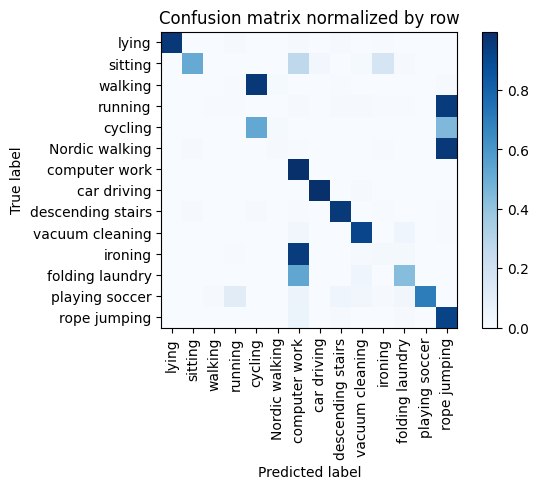

Training Epoch:   7%|▋         | 1/15 [00:36<08:30, 36.46s/it]

Overall accuracy: 0.513

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.458      0.997      0.627      0.138        576|	 folding laundry: 0.002,	ironing: 0.002,	
          walking       0.000      0.000      0.000      0.113        469|	 cycling: 0.964,	Nordic walking: 0.013,	rope jumping: 0.009,	
          ironing       0.100      0.017      0.029      0.112        466|	 computer work: 0.948,	folding laundry: 0.019,	
            lying       1.000      0.964      0.981      0.093        385|	 computer work: 0.010,	running: 0.010,	
          sitting       0.970      0.512      0.670      0.090        373|	 computer work: 0.271,	ironing: 0.166,	
   Nordic walking       0.267      0.011      0.021      0.086        358|	 rope jumping: 0.964,	sitting: 0.008,	
  vacuum cleaning       0.923      0.914      0.918      0.078        326|	 folding laundry: 0.040,	computer work: 0.034,	
          cycling       0.266      0.5


train: 100%|██████████| 261/261 [00:26<00:00,  9.68batch/s, loss=3.35e+3, accuracy=0.516]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.17batch/s, loss=3.23e+3]


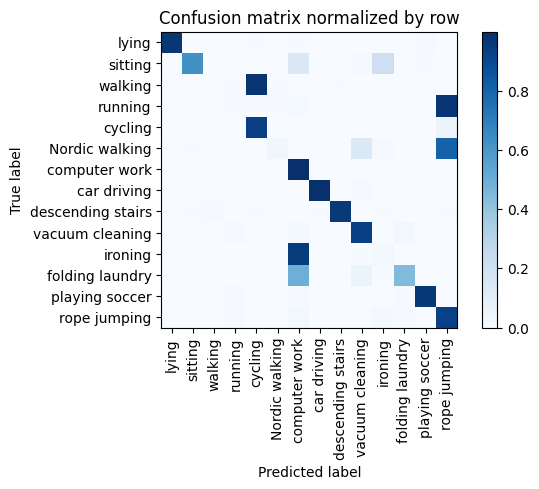

Training Epoch:  13%|█▎        | 2/15 [01:07<07:11, 33.21s/it]

Overall accuracy: 0.568

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.481      0.998      0.650      0.138        573|	 folding laundry: 0.002,	rope jumping: 0.000,	
          walking       0.000      0.000      0.000      0.113        469|	 cycling: 0.981,	Nordic walking: 0.006,	descending stairs: 0.004,	
          ironing       0.136      0.030      0.049      0.112        467|	 computer work: 0.955,	vacuum cleaning: 0.006,	
            lying       1.000      0.969      0.984      0.093        386|	 playing soccer: 0.010,	computer work: 0.005,	
          sitting       0.983      0.626      0.765      0.090        374|	 ironing: 0.211,	computer work: 0.147,	
   Nordic walking       0.684      0.036      0.069      0.086        358|	 rope jumping: 0.804,	vacuum cleaning: 0.140,	
  vacuum cleaning       0.815      0.935      0.871      0.078        325|	 folding laundry: 0.025,	computer work: 0.022,	
          cyc


train: 100%|██████████| 261/261 [00:24<00:00, 10.46batch/s, loss=3.24e+3, accuracy=0.547]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.41batch/s, loss=3.37e+3]


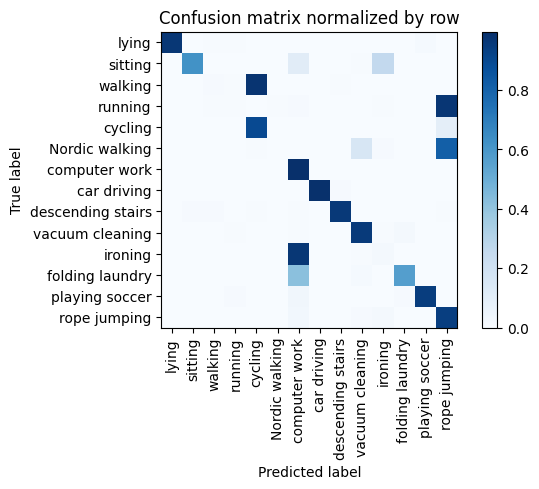

Training Epoch:  20%|██        | 3/15 [01:35<06:13, 31.10s/it]

Overall accuracy: 0.567

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.493      0.997      0.660      0.138        575|	 playing soccer: 0.002,	folding laundry: 0.002,	
          walking       0.400      0.008      0.017      0.113        472|	 cycling: 0.979,	descending stairs: 0.004,	
          ironing       0.087      0.021      0.034      0.113        469|	 computer work: 0.966,	vacuum cleaning: 0.006,	
            lying       1.000      0.969      0.984      0.093        385|	 playing soccer: 0.013,	running: 0.005,	
          sitting       0.983      0.620      0.760      0.089        371|	 ironing: 0.259,	computer work: 0.111,	
   Nordic walking       0.333      0.003      0.005      0.087        361|	 rope jumping: 0.817,	vacuum cleaning: 0.161,	ironing: 0.008,	
  vacuum cleaning       0.822      0.957      0.884      0.078        324|	 folding laundry: 0.022,	ironing: 0.006,	
          cycling       0.380 


train: 100%|██████████| 261/261 [00:26<00:00,  9.87batch/s, loss=3.3e+3, accuracy=0.547]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:04<00:00, 16.20batch/s, loss=3.36e+3]


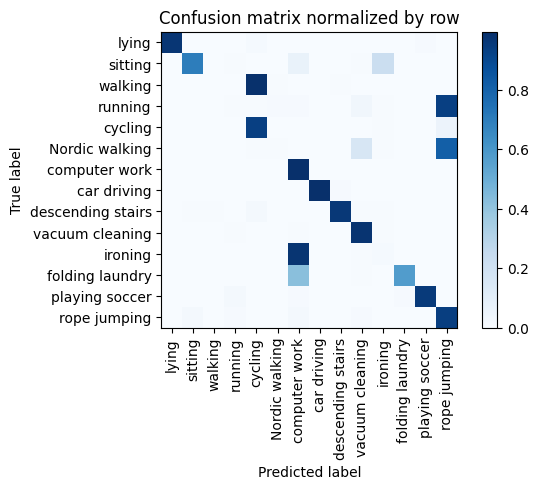

Training Epoch:  27%|██▋       | 4/15 [02:06<05:40, 30.98s/it]

Overall accuracy: 0.579

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.501      0.995      0.666      0.139        577|	 playing soccer: 0.003,	ironing: 0.002,	
          walking       0.000      0.000      0.000      0.113        472|	 cycling: 0.987,	descending stairs: 0.004,	Nordic walking: 0.004,	
          ironing       0.070      0.015      0.025      0.112        467|	 computer work: 0.974,	vacuum cleaning: 0.006,	
            lying       1.000      0.969      0.984      0.093        385|	 cycling: 0.013,	playing soccer: 0.008,	
          sitting       0.981      0.699      0.816      0.090        375|	 ironing: 0.221,	computer work: 0.069,	
   Nordic walking       0.286      0.006      0.011      0.085        355|	 rope jumping: 0.814,	vacuum cleaning: 0.161,	ironing: 0.006,	
  vacuum cleaning       0.814      0.978      0.889      0.077        322|	 ironing: 0.006,	computer work: 0.006,	
          cycling


train: 100%|██████████| 261/261 [00:28<00:00,  9.20batch/s, loss=3.38e+3, accuracy=0.516]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.81batch/s, loss=3.28e+3]


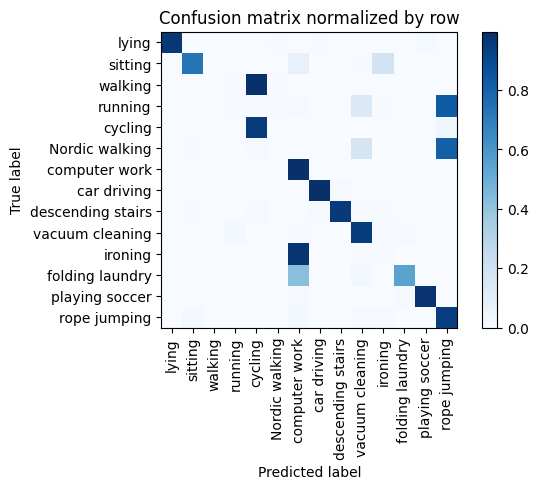

Training Epoch:  33%|███▎      | 5/15 [02:38<05:14, 31.41s/it]

Overall accuracy: 0.579

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.498      0.997      0.664      0.139        578|	 playing soccer: 0.003,	rope jumping: 0.000,	
          ironing       0.062      0.011      0.018      0.113        469|	 computer work: 0.979,	vacuum cleaning: 0.006,	
          walking       0.000      0.000      0.000      0.113        468|	 cycling: 0.989,	Nordic walking: 0.004,	running: 0.004,	
            lying       1.000      0.966      0.983      0.092        384|	 playing soccer: 0.013,	car driving: 0.005,	
          sitting       0.979      0.733      0.838      0.090        374|	 ironing: 0.182,	computer work: 0.078,	
   Nordic walking       0.000      0.000      0.000      0.086        359|	 rope jumping: 0.813,	vacuum cleaning: 0.164,	cycling: 0.008,	
  vacuum cleaning       0.753      0.951      0.840      0.078        324|	 running: 0.022,	folding laundry: 0.009,	
          cyclin


train: 100%|██████████| 261/261 [00:28<00:00,  9.23batch/s, loss=3.43e+3, accuracy=0.547]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.26batch/s, loss=3.18e+3]


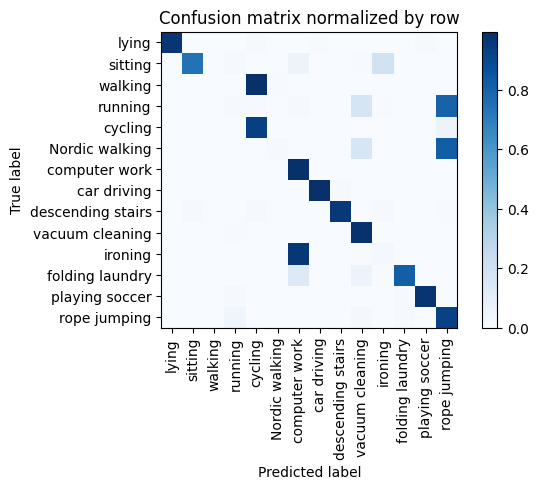

Training Epoch:  40%|████      | 6/15 [03:11<04:44, 31.66s/it]

Overall accuracy: 0.594

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.534      0.995      0.695      0.139        578|	 playing soccer: 0.003,	ironing: 0.002,	
          walking       0.000      0.000      0.000      0.113        472|	 cycling: 0.989,	Nordic walking: 0.006,	descending stairs: 0.002,	
          ironing       0.114      0.021      0.036      0.113        468|	 computer work: 0.966,	vacuum cleaning: 0.006,	
            lying       1.000      0.969      0.984      0.093        385|	 cycling: 0.013,	playing soccer: 0.008,	
          sitting       0.986      0.739      0.844      0.089        371|	 ironing: 0.189,	computer work: 0.059,	
   Nordic walking       0.429      0.008      0.016      0.087        363|	 rope jumping: 0.818,	vacuum cleaning: 0.163,	
  vacuum cleaning       0.739      0.984      0.844      0.077        322|	 running: 0.006,	rope jumping: 0.003,	
          cycling       0.381     


train: 100%|██████████| 261/261 [00:25<00:00, 10.09batch/s, loss=3.17e+3, accuracy=0.578]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.90batch/s, loss=3.32e+3]


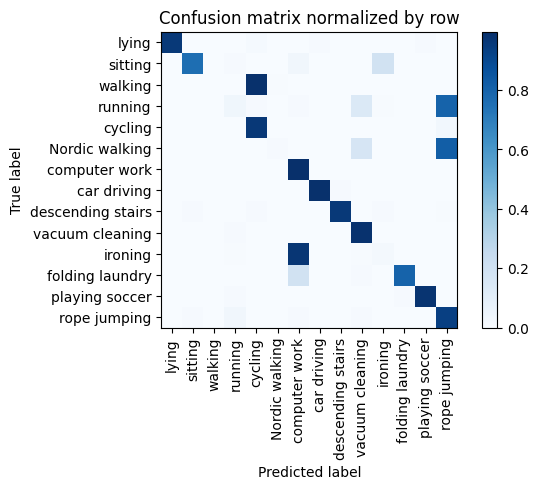

Training Epoch:  47%|████▋     | 7/15 [03:40<04:08, 31.00s/it]

Overall accuracy: 0.599

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.532      0.997      0.694      0.139        578|	 playing soccer: 0.002,	ironing: 0.002,	
          walking       0.000      0.000      0.000      0.114        474|	 cycling: 0.989,	Nordic walking: 0.006,	vacuum cleaning: 0.002,	
          ironing       0.093      0.017      0.029      0.112        466|	 computer work: 0.970,	vacuum cleaning: 0.006,	
            lying       1.000      0.961      0.980      0.092        383|	 cycling: 0.013,	car driving: 0.010,	
          sitting       0.986      0.758      0.857      0.089        372|	 ironing: 0.194,	computer work: 0.035,	
   Nordic walking       0.429      0.008      0.016      0.087        360|	 rope jumping: 0.819,	vacuum cleaning: 0.164,	
  vacuum cleaning       0.770      0.988      0.865      0.078        325|	 running: 0.009,	folding laundry: 0.003,	
          cycling       0.388      0


train: 100%|██████████| 261/261 [00:26<00:00,  9.93batch/s, loss=3.37e+3, accuracy=0.594]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.96batch/s, loss=3.35e+3]


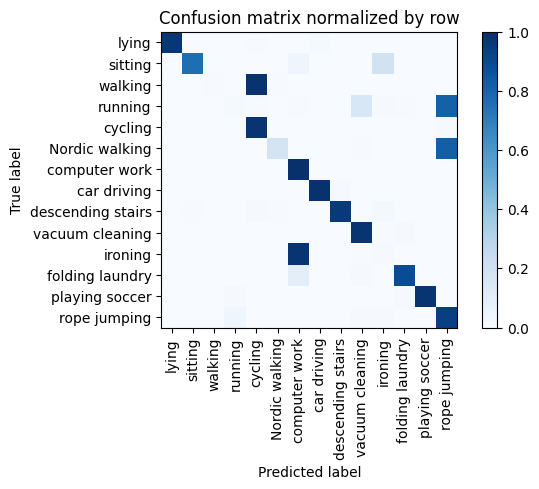

Training Epoch:  53%|█████▎    | 8/15 [04:10<03:34, 30.64s/it]

Overall accuracy: 0.619

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.538      1.000      0.700      0.138        576|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       0.500      0.004      0.008      0.113        470|	 cycling: 0.987,	Nordic walking: 0.004,	
          ironing       0.047      0.009      0.014      0.112        466|	 computer work: 0.981,	vacuum cleaning: 0.006,	
            lying       1.000      0.969      0.984      0.093        387|	 car driving: 0.013,	cycling: 0.008,	
          sitting       0.993      0.758      0.860      0.089        372|	 ironing: 0.194,	computer work: 0.040,	
   Nordic walking       0.939      0.172      0.291      0.087        360|	 rope jumping: 0.817,	vacuum cleaning: 0.006,	
  vacuum cleaning       0.886      0.982      0.931      0.078        325|	 folding laundry: 0.009,	ironing: 0.006,	
          cycling       0.398      0.984      0.566    


train: 100%|██████████| 261/261 [00:25<00:00, 10.18batch/s, loss=3.41e+3, accuracy=0.719]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.04batch/s, loss=3.47e+3]


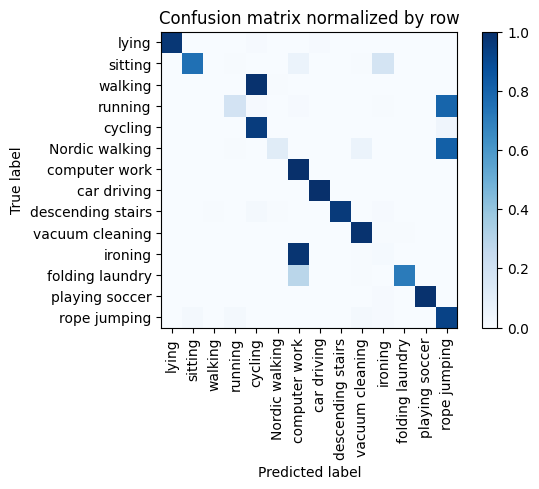

Training Epoch:  60%|██████    | 9/15 [04:40<03:01, 30.32s/it]

Overall accuracy: 0.610

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.513      1.000      0.679      0.138        573|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       0.000      0.000      0.000      0.114        473|	 cycling: 0.989,	Nordic walking: 0.006,	descending stairs: 0.002,	
          ironing       0.076      0.013      0.022      0.113        470|	 computer work: 0.979,	vacuum cleaning: 0.006,	
            lying       1.000      0.971      0.986      0.093        385|	 car driving: 0.010,	cycling: 0.010,	
          sitting       0.986      0.753      0.854      0.090        373|	 ironing: 0.174,	computer work: 0.062,	
   Nordic walking       0.891      0.114      0.201      0.087        361|	 rope jumping: 0.814,	vacuum cleaning: 0.061,	
  vacuum cleaning       0.915      0.985      0.948      0.078        326|	 folding laundry: 0.006,	ironing: 0.006,	
          cycling       0.386


train: 100%|██████████| 261/261 [00:25<00:00, 10.06batch/s, loss=3.35e+3, accuracy=0.719]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.25batch/s, loss=3.36e+3]


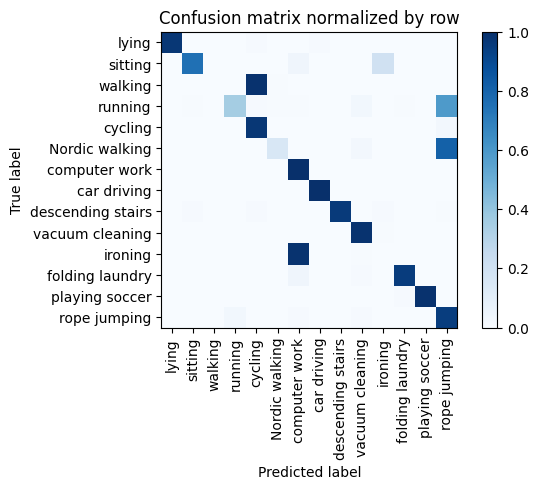

Training Epoch:  67%|██████▋   | 10/15 [05:09<02:30, 30.12s/it]

Overall accuracy: 0.635

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.541      1.000      0.702      0.139        577|	 rope jumping: 0.000,	playing soccer: 0.000,	
          ironing       0.012      0.002      0.004      0.113        470|	 computer work: 0.987,	vacuum cleaning: 0.006,	
          walking       1.000      0.002      0.004      0.113        468|	 cycling: 0.989,	Nordic walking: 0.004,	rope jumping: 0.002,	
            lying       1.000      0.971      0.986      0.093        385|	 car driving: 0.010,	cycling: 0.010,	
          sitting       0.983      0.753      0.853      0.090        373|	 ironing: 0.198,	computer work: 0.040,	
   Nordic walking       0.949      0.155      0.266      0.087        362|	 rope jumping: 0.812,	vacuum cleaning: 0.025,	
  vacuum cleaning       0.935      0.985      0.959      0.078        324|	 ironing: 0.006,	rope jumping: 0.003,	
          cycling       0.394      0.


train: 100%|██████████| 261/261 [00:25<00:00, 10.13batch/s, loss=3.37e+3, accuracy=0.609]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.52batch/s, loss=3.33e+3]


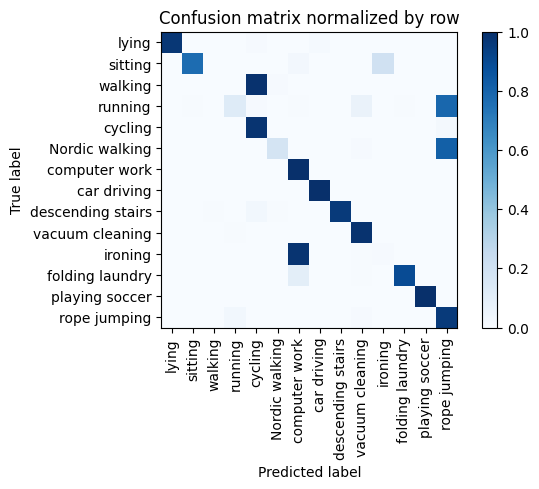

Training Epoch:  73%|███████▎  | 11/15 [05:39<01:59, 29.95s/it]

Overall accuracy: 0.626

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.542      1.000      0.703      0.139        579|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       0.000      0.000      0.000      0.113        469|	 cycling: 0.991,	Nordic walking: 0.009,	rope jumping: 0.000,	
          ironing       0.051      0.009      0.015      0.112        467|	 computer work: 0.981,	vacuum cleaning: 0.006,	
            lying       1.000      0.969      0.984      0.093        387|	 car driving: 0.013,	cycling: 0.010,	
          sitting       0.993      0.769      0.867      0.090        373|	 ironing: 0.196,	computer work: 0.027,	
   Nordic walking       0.899      0.173      0.290      0.086        359|	 rope jumping: 0.813,	vacuum cleaning: 0.008,	
  vacuum cleaning       0.933      0.988      0.960      0.078        324|	 running: 0.006,	rope jumping: 0.003,	
          cycling       0.392      0.


train: 100%|██████████| 261/261 [00:26<00:00,  9.95batch/s, loss=3.34e+3, accuracy=0.625]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.46batch/s, loss=3.28e+3]


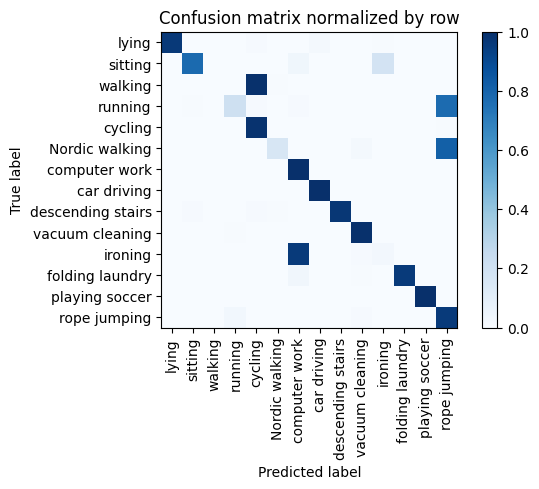

Training Epoch:  80%|████████  | 12/15 [06:09<01:29, 29.99s/it]

Overall accuracy: 0.635

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.549      1.000      0.709      0.138        575|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       0.000      0.000      0.000      0.113        471|	 cycling: 0.994,	Nordic walking: 0.004,	descending stairs: 0.002,	
          ironing       0.148      0.026      0.044      0.113        468|	 computer work: 0.959,	vacuum cleaning: 0.011,	
            lying       1.000      0.963      0.981      0.092        381|	 car driving: 0.018,	cycling: 0.010,	
          sitting       0.983      0.774      0.866      0.089        372|	 ironing: 0.180,	computer work: 0.038,	
   Nordic walking       0.951      0.160      0.274      0.087        362|	 rope jumping: 0.815,	vacuum cleaning: 0.019,	
  vacuum cleaning       0.956      0.994      0.974      0.078        325|	 running: 0.006,	rope jumping: 0.000,	
          cycling       0.395   


train: 100%|██████████| 261/261 [00:26<00:00,  9.68batch/s, loss=2.96e+3, accuracy=0.578]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.09batch/s, loss=3.13e+3]


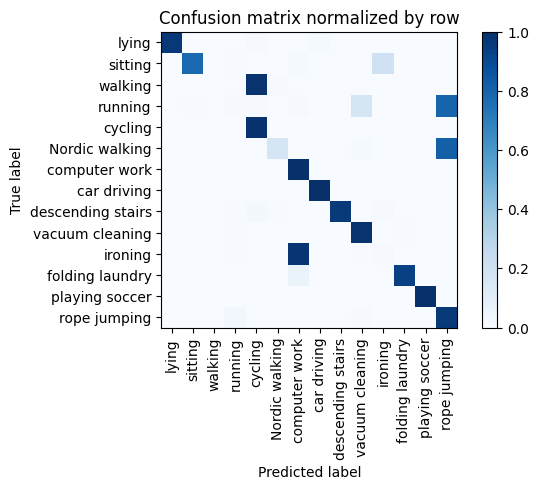

Training Epoch:  87%|████████▋ | 13/15 [06:40<01:00, 30.27s/it]

Overall accuracy: 0.623

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.546      1.000      0.706      0.138        576|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       0.500      0.002      0.004      0.113        472|	 cycling: 0.987,	Nordic walking: 0.008,	descending stairs: 0.002,	
          ironing       0.049      0.009      0.015      0.112        467|	 computer work: 0.981,	vacuum cleaning: 0.004,	
            lying       1.000      0.966      0.983      0.093        386|	 car driving: 0.016,	cycling: 0.010,	
          sitting       0.990      0.778      0.871      0.090        374|	 ironing: 0.201,	computer work: 0.013,	
   Nordic walking       0.923      0.167      0.283      0.086        359|	 rope jumping: 0.816,	vacuum cleaning: 0.014,	
  vacuum cleaning       0.876      0.988      0.928      0.077        322|	 folding laundry: 0.006,	running: 0.006,	
          cycling       0.397


train: 100%|██████████| 261/261 [00:26<00:00,  9.83batch/s, loss=3.23e+3, accuracy=0.594]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.55batch/s, loss=3.2e+3]


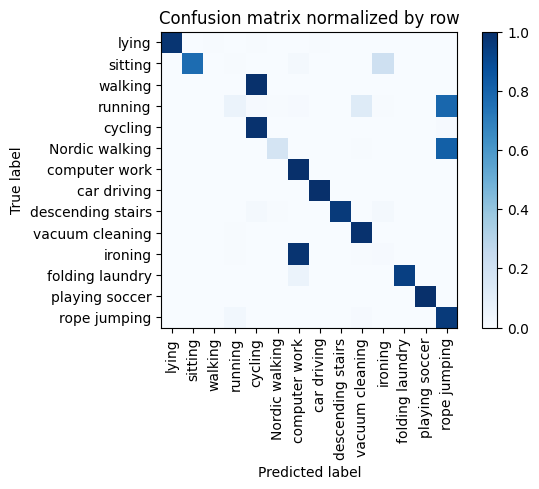

Training Epoch:  93%|█████████▎| 14/15 [07:10<00:30, 30.30s/it]

Overall accuracy: 0.627

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.544      1.000      0.705      0.138        576|	 rope jumping: 0.000,	playing soccer: 0.000,	
          ironing       0.047      0.009      0.014      0.113        469|	 computer work: 0.981,	vacuum cleaning: 0.004,	
          walking       0.000      0.000      0.000      0.113        469|	 cycling: 0.996,	Nordic walking: 0.002,	running: 0.002,	
            lying       1.000      0.979      0.990      0.093        385|	 cycling: 0.008,	car driving: 0.005,	
          sitting       0.997      0.767      0.867      0.090        373|	 ironing: 0.206,	computer work: 0.019,	
   Nordic walking       0.955      0.175      0.296      0.086        359|	 rope jumping: 0.813,	vacuum cleaning: 0.006,	
  vacuum cleaning       0.909      0.991      0.948      0.078        323|	 running: 0.006,	folding laundry: 0.003,	
          cycling       0.397      0.99


train: 100%|██████████| 261/261 [00:26<00:00,  9.79batch/s, loss=3.26e+3, accuracy=0.719]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.44batch/s, loss=3.11e+3]


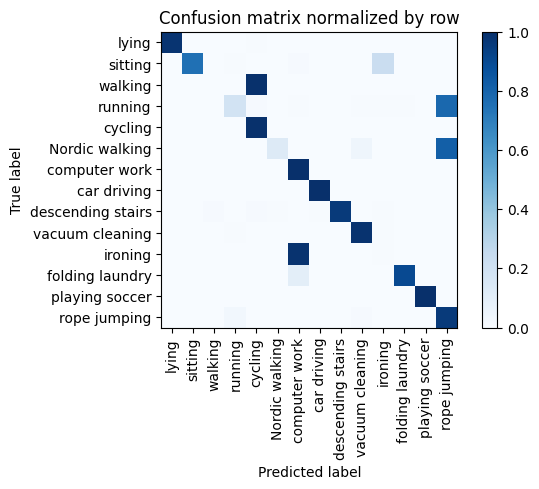

Overall accuracy: 0.626

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.543      1.000      0.704      0.139        579|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       0.200      0.002      0.004      0.113        472|	 cycling: 0.996,	Nordic walking: 0.002,	
          ironing       0.032      0.006      0.011      0.113        469|	 computer work: 0.987,	vacuum cleaning: 0.002,	
            lying       1.000      0.982      0.991      0.093        388|	 cycling: 0.008,	ironing: 0.003,	
          sitting       0.993      0.752      0.856      0.089        371|	 ironing: 0.229,	computer work: 0.008,	
   Nordic walking       0.959      0.131      0.230      0.087        360|	 rope jumping: 0.817,	vacuum cleaning: 0.044,	
  vacuum cleaning       0.944      0.985      0.964      0.078        323|	 ironing: 0.006,	running: 0.006,	
          cycling       0.396      0.994      0.566      0.076     

unseen: 100%|██████████| 87/87 [00:04<00:00, 18.06batch/s, loss=3.2e+3] 


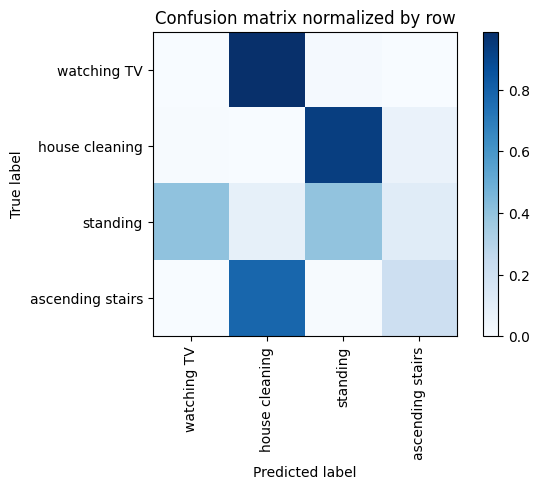

Overall accuracy: 0.174

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.301      0.401      0.344      0.331       1844|	 watching TV: 0.402,	ascending stairs: 0.113,	
  house cleaning       0.000      0.000      0.000      0.327       1822|	 standing: 0.932,	ascending stairs: 0.064,	watching TV: 0.004,	
ascending stairs       0.412      0.211      0.279      0.194       1079|	 house cleaning: 0.780,	standing: 0.007,	
     watching TV       0.000      0.000      0.000      0.148        823|	 house cleaning: 0.988,	standing: 0.012,	ascending stairs: 0.000,	

----------------------------------------------------------------------------------------------------
     avg / total       0.180      0.174      0.168        1.0       5568|	      

{'accuracy': 0.17385057471264367, 'precision': 0.1783998739478474, 'recall': 0.15315207099045272, 'f1': 0.15589945280437756}
================ Fold-1 ================
Unseen Classes : 

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 400])



train: 100%|██████████| 262/262 [00:26<00:00,  9.98batch/s, loss=3.13e+3, accuracy=0.5]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.34batch/s, loss=3.37e+3]


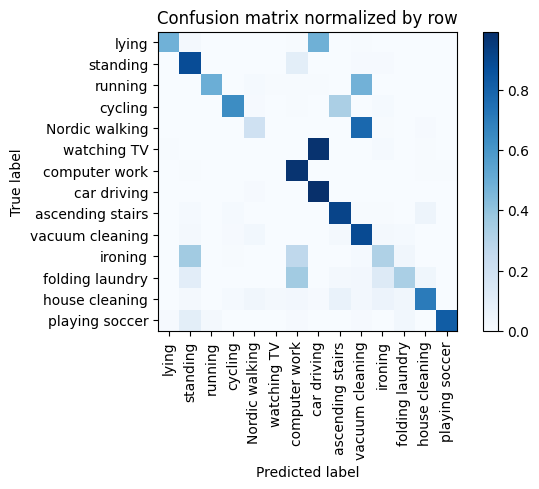

Training Epoch:   7%|▋         | 1/15 [00:30<07:01, 30.14s/it]

Overall accuracy: 0.628

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.712      0.974      0.823      0.149        621|	 playing soccer: 0.006,	standing: 0.006,	
         ironing       0.696      0.319      0.438      0.112        467|	 standing: 0.358,	computer work: 0.270,	
  house cleaning       0.908      0.703      0.792      0.091        380|	 ascending stairs: 0.068,	ironing: 0.058,	
           lying       0.989      0.482      0.649      0.089        371|	 car driving: 0.488,	standing: 0.016,	
  Nordic walking       0.733      0.200      0.314      0.089        370|	 vacuum cleaning: 0.776,	house cleaning: 0.011,	
        standing       0.590      0.880      0.706      0.088        366|	 computer work: 0.098,	ironing: 0.011,	
         cycling       0.930      0.637      0.756      0.075        314|	 ascending stairs: 0.331,	ironing: 0.013,	
 vacuum cleaning       0.408      0.890      0.560      0.074       


train: 100%|██████████| 262/262 [00:26<00:00,  9.87batch/s, loss=3.35e+3, accuracy=0.5]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 17.49batch/s, loss=3.17e+3]


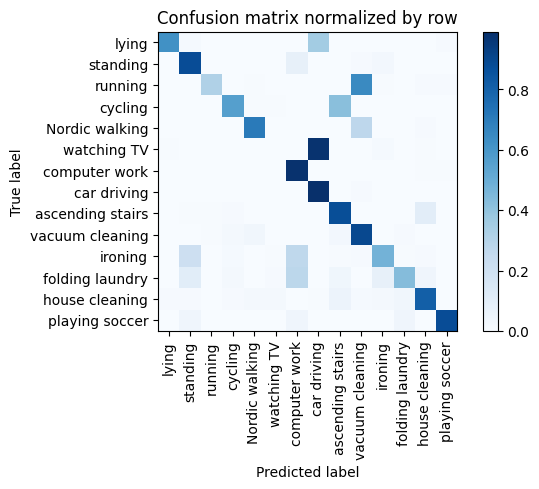

Training Epoch:  13%|█▎        | 2/15 [01:00<06:35, 30.41s/it]

Overall accuracy: 0.705

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.741      0.981      0.844      0.148        617|	 playing soccer: 0.006,	house cleaning: 0.005,	
         ironing       0.862      0.473      0.611      0.111        463|	 computer work: 0.268,	standing: 0.210,	
  house cleaning       0.865      0.811      0.837      0.091        380|	 ascending stairs: 0.055,	folding laundry: 0.032,	
           lying       0.979      0.621      0.760      0.091        377|	 car driving: 0.353,	standing: 0.013,	
        standing       0.704      0.879      0.782      0.088        365|	 computer work: 0.079,	ironing: 0.025,	
  Nordic walking       0.924      0.706      0.801      0.087        364|	 vacuum cleaning: 0.275,	house cleaning: 0.011,	
         cycling       0.893      0.559      0.688      0.076        315|	 ascending stairs: 0.419,	watching TV: 0.006,	
 vacuum cleaning       0.551      0.897      0.683


train: 100%|██████████| 262/262 [00:26<00:00,  9.78batch/s, loss=3.28e+3, accuracy=0.531]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.32batch/s, loss=3.24e+3]


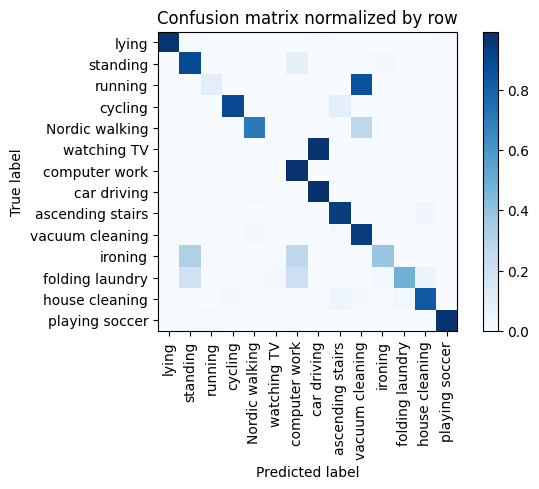

Training Epoch:  20%|██        | 3/15 [01:31<06:06, 30.57s/it]

Overall accuracy: 0.756

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.751      0.982      0.851      0.149        620|	 playing soccer: 0.006,	standing: 0.005,	
         ironing       0.887      0.387      0.539      0.112        465|	 standing: 0.318,	computer work: 0.269,	
  house cleaning       0.915      0.831      0.871      0.091        378|	 ascending stairs: 0.045,	folding laundry: 0.029,	
           lying       0.994      0.965      0.980      0.090        373|	 standing: 0.013,	playing soccer: 0.008,	
  Nordic walking       0.942      0.707      0.807      0.088        368|	 vacuum cleaning: 0.272,	house cleaning: 0.008,	
        standing       0.615      0.888      0.726      0.088        365|	 computer work: 0.085,	ironing: 0.016,	
         cycling       0.953      0.892      0.921      0.076        315|	 ascending stairs: 0.089,	Nordic walking: 0.006,	
 vacuum cleaning       0.526      0.936      0.674


train: 100%|██████████| 262/262 [00:27<00:00,  9.56batch/s, loss=3.3e+3, accuracy=0.688]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:04<00:00, 14.88batch/s, loss=3.36e+3]


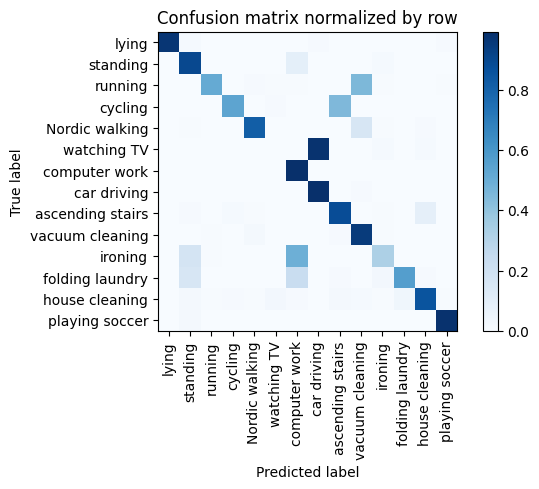

Training Epoch:  27%|██▋       | 4/15 [02:03<05:43, 31.19s/it]

Overall accuracy: 0.755

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.664      0.990      0.795      0.149        618|	 playing soccer: 0.003,	lying: 0.003,	
         ironing       0.882      0.323      0.473      0.112        464|	 computer work: 0.491,	standing: 0.172,	
  house cleaning       0.918      0.855      0.885      0.091        379|	 folding laundry: 0.037,	watching TV: 0.024,	
           lying       0.992      0.965      0.978      0.090        375|	 standing: 0.013,	car driving: 0.011,	
        standing       0.720      0.896      0.799      0.088        367|	 computer work: 0.090,	ironing: 0.014,	
  Nordic walking       0.964      0.814      0.883      0.088        365|	 vacuum cleaning: 0.162,	house cleaning: 0.011,	
         cycling       0.950      0.536      0.685      0.076        317|	 ascending stairs: 0.448,	watching TV: 0.009,	
 vacuum cleaning       0.669      0.948      0.784      0.074   


train: 100%|██████████| 262/262 [00:26<00:00,  9.86batch/s, loss=3.24e+3, accuracy=0.719]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.04batch/s, loss=3.19e+3]


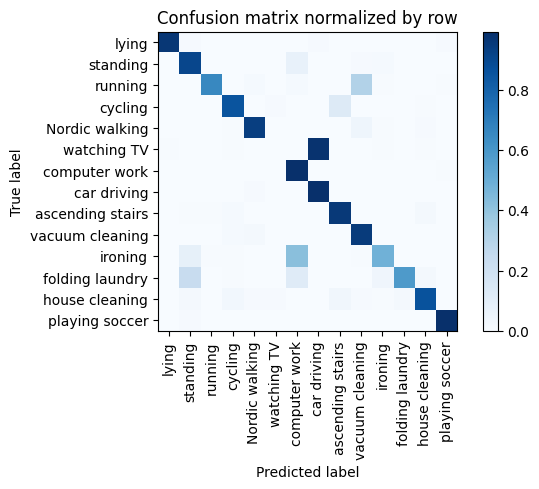

Training Epoch:  33%|███▎      | 5/15 [02:34<05:09, 30.95s/it]

Overall accuracy: 0.819

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.714      0.989      0.829      0.149        620|	 playing soccer: 0.005,	standing: 0.003,	
         ironing       0.914      0.481      0.630      0.112        466|	 computer work: 0.418,	standing: 0.082,	
  house cleaning       0.956      0.862      0.907      0.091        378|	 ascending stairs: 0.034,	cycling: 0.029,	
           lying       0.992      0.963      0.977      0.090        374|	 playing soccer: 0.011,	car driving: 0.011,	
  Nordic walking       0.961      0.935      0.948      0.089        369|	 vacuum cleaning: 0.043,	house cleaning: 0.008,	
        standing       0.769      0.904      0.831      0.087        364|	 computer work: 0.071,	ironing: 0.014,	
         cycling       0.909      0.854      0.881      0.076        316|	 ascending stairs: 0.127,	watching TV: 0.009,	
 vacuum cleaning       0.784      0.948      0.858      0.


train: 100%|██████████| 262/262 [00:25<00:00, 10.12batch/s, loss=3.38e+3, accuracy=0.766]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.86batch/s, loss=3.23e+3]


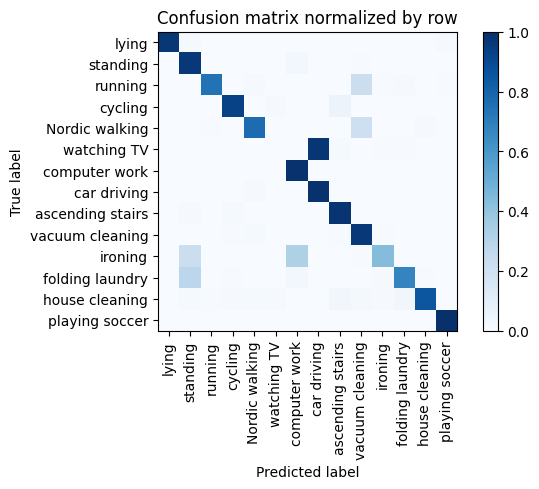

Training Epoch:  40%|████      | 6/15 [03:03<04:34, 30.51s/it]

Overall accuracy: 0.821

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.786      0.990      0.876      0.148        616|	 playing soccer: 0.003,	standing: 0.003,	
         ironing       0.949      0.437      0.598      0.112        465|	 computer work: 0.323,	standing: 0.226,	
  house cleaning       0.985      0.852      0.913      0.091        378|	 folding laundry: 0.034,	ascending stairs: 0.034,	
           lying       0.995      0.971      0.983      0.090        376|	 playing soccer: 0.011,	standing: 0.011,	
  Nordic walking       0.956      0.769      0.852      0.088        368|	 vacuum cleaning: 0.212,	house cleaning: 0.008,	
        standing       0.672      0.967      0.793      0.088        365|	 computer work: 0.027,	vacuum cleaning: 0.005,	
         cycling       0.961      0.927      0.944      0.076        316|	 ascending stairs: 0.057,	watching TV: 0.009,	
 vacuum cleaning       0.700      0.968      


train: 100%|██████████| 262/262 [00:27<00:00,  9.68batch/s, loss=3.39e+3, accuracy=0.75]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.15batch/s, loss=2.97e+3]


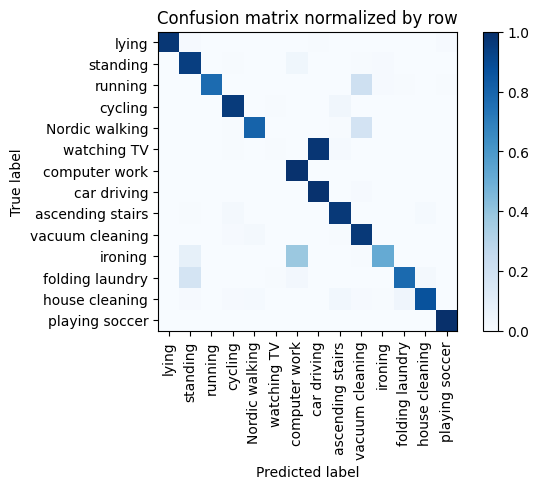

Training Epoch:  47%|████▋     | 7/15 [03:34<04:04, 30.61s/it]

Overall accuracy: 0.840

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.760      0.992      0.861      0.150        622|	 standing: 0.003,	lying: 0.003,	
         ironing       0.964      0.519      0.675      0.111        462|	 computer work: 0.381,	standing: 0.084,	
  house cleaning       0.976      0.871      0.921      0.091        379|	 folding laundry: 0.042,	ascending stairs: 0.029,	
           lying       0.995      0.971      0.982      0.090        374|	 standing: 0.011,	playing soccer: 0.008,	
  Nordic walking       0.961      0.803      0.875      0.088        365|	 vacuum cleaning: 0.184,	ascending stairs: 0.005,	
        standing       0.802      0.942      0.867      0.087        362|	 computer work: 0.036,	ironing: 0.011,	
         cycling       0.950      0.956      0.953      0.076        315|	 ascending stairs: 0.035,	watching TV: 0.006,	
 vacuum cleaning       0.727      0.961      0.828      0.07


train: 100%|██████████| 262/262 [00:28<00:00,  9.28batch/s, loss=3.58e+3, accuracy=0.859]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.92batch/s, loss=3.34e+3]


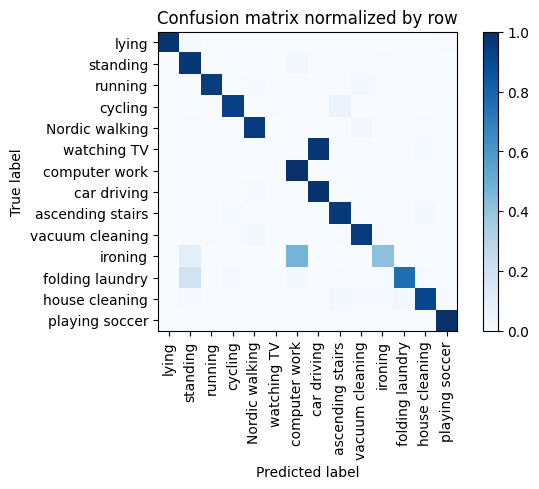

Training Epoch:  53%|█████▎    | 8/15 [04:06<03:37, 31.05s/it]

Overall accuracy: 0.854

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.726      0.994      0.839      0.149        619|	 lying: 0.003,	playing soccer: 0.002,	
         ironing       0.946      0.418      0.580      0.111        462|	 computer work: 0.474,	standing: 0.100,	
  house cleaning       0.972      0.916      0.943      0.091        380|	 folding laundry: 0.026,	ascending stairs: 0.016,	
           lying       0.995      0.979      0.987      0.090        375|	 standing: 0.011,	playing soccer: 0.005,	
  Nordic walking       0.978      0.954      0.966      0.089        369|	 vacuum cleaning: 0.024,	house cleaning: 0.005,	
        standing       0.790      0.970      0.871      0.088        368|	 computer work: 0.024,	ironing: 0.005,	
         cycling       0.955      0.934      0.944      0.076        317|	 ascending stairs: 0.057,	watching TV: 0.006,	
 vacuum cleaning       0.942      0.954      0.948      


train: 100%|██████████| 262/262 [00:26<00:00,  9.77batch/s, loss=2.99e+3, accuracy=0.828]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.34batch/s, loss=3.35e+3]


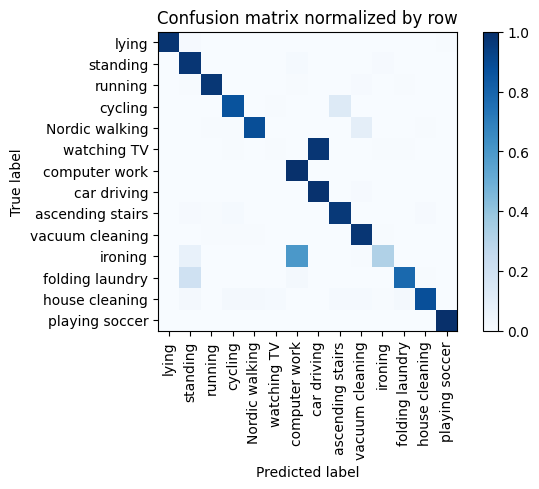

Training Epoch:  60%|██████    | 9/15 [04:37<03:05, 30.96s/it]

Overall accuracy: 0.832

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.683      0.995      0.810      0.148        616|	 playing soccer: 0.002,	standing: 0.002,	
         ironing       0.948      0.317      0.475      0.112        464|	 computer work: 0.595,	standing: 0.078,	
  house cleaning       0.985      0.882      0.931      0.092        382|	 standing: 0.021,	folding laundry: 0.016,	
           lying       0.997      0.979      0.988      0.091        377|	 standing: 0.011,	playing soccer: 0.005,	
        standing       0.796      0.973      0.876      0.088        366|	 computer work: 0.014,	ironing: 0.008,	
  Nordic walking       0.973      0.885      0.927      0.087        364|	 vacuum cleaning: 0.096,	house cleaning: 0.005,	
         cycling       0.951      0.864      0.906      0.076        317|	 ascending stairs: 0.129,	watching TV: 0.006,	
 vacuum cleaning       0.865      0.974      0.916      0.074


train: 100%|██████████| 262/262 [00:26<00:00,  9.99batch/s, loss=2.99e+3, accuracy=0.656]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 20.04batch/s, loss=3.14e+3]


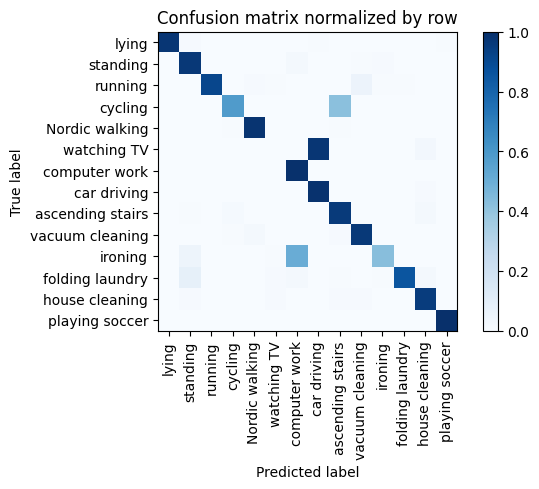

Training Epoch:  67%|██████▋   | 10/15 [05:07<02:33, 30.61s/it]

Overall accuracy: 0.837

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.716      0.995      0.833      0.150        624|	 lying: 0.003,	standing: 0.002,	
         ironing       0.961      0.429      0.593      0.112        464|	 computer work: 0.506,	standing: 0.050,	
  house cleaning       0.960      0.950      0.955      0.091        379|	 vacuum cleaning: 0.011,	standing: 0.011,	
           lying       0.995      0.976      0.985      0.089        372|	 standing: 0.011,	playing soccer: 0.005,	
  Nordic walking       0.976      0.981      0.978      0.089        369|	 ascending stairs: 0.005,	cycling: 0.005,	
        standing       0.876      0.967      0.919      0.088        366|	 computer work: 0.016,	ironing: 0.011,	
         cycling       0.958      0.581      0.723      0.076        315|	 ascending stairs: 0.419,	playing soccer: 0.000,	
 vacuum cleaning       0.946      0.964      0.955      0.074        308|


train: 100%|██████████| 262/262 [00:29<00:00,  8.97batch/s, loss=3.4e+3, accuracy=0.969] 


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.79batch/s, loss=3.15e+3]


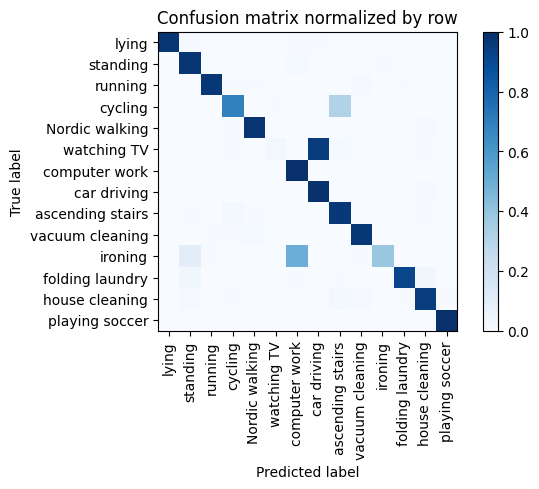

Training Epoch:  73%|███████▎  | 11/15 [05:40<02:05, 31.29s/it]

Overall accuracy: 0.848

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.723      0.995      0.837      0.149        621|	 lying: 0.003,	standing: 0.002,	
         ironing       0.983      0.385      0.553      0.111        460|	 computer work: 0.498,	standing: 0.104,	
  house cleaning       0.965      0.942      0.954      0.092        381|	 ascending stairs: 0.016,	vacuum cleaning: 0.010,	
           lying       0.995      0.976      0.985      0.090        376|	 standing: 0.011,	car driving: 0.005,	
  Nordic walking       0.984      0.984      0.984      0.088        367|	 house cleaning: 0.008,	cycling: 0.005,	
        standing       0.844      0.975      0.905      0.088        367|	 computer work: 0.014,	ironing: 0.005,	
         cycling       0.943      0.684      0.793      0.075        313|	 ascending stairs: 0.310,	watching TV: 0.006,	
 vacuum cleaning       0.968      0.971      0.969      0.074        308|


train: 100%|██████████| 262/262 [00:25<00:00, 10.17batch/s, loss=3e+3, accuracy=0.781]   


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.47batch/s, loss=3.49e+3]


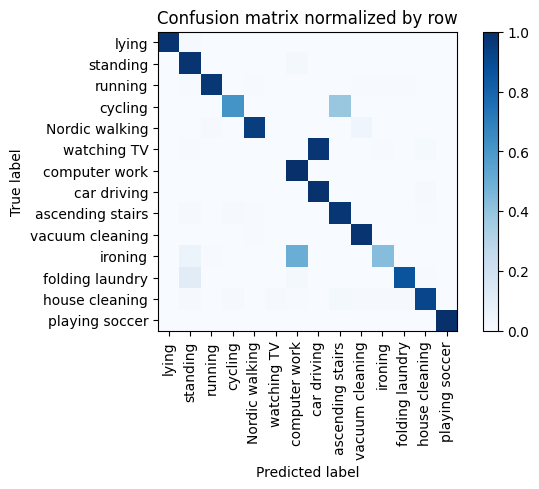

Training Epoch:  80%|████████  | 12/15 [06:09<01:32, 30.73s/it]

Overall accuracy: 0.839

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.715      0.995      0.832      0.149        620|	 lying: 0.003,	standing: 0.002,	
         ironing       0.971      0.430      0.596      0.112        465|	 computer work: 0.501,	standing: 0.062,	
           lying       0.995      0.981      0.988      0.090        376|	 standing: 0.011,	playing soccer: 0.003,	
  house cleaning       0.986      0.917      0.950      0.090        375|	 ascending stairs: 0.019,	vacuum cleaning: 0.011,	
        standing       0.849      0.981      0.910      0.088        368|	 computer work: 0.019,	playing soccer: 0.000,	
  Nordic walking       0.983      0.946      0.964      0.088        367|	 vacuum cleaning: 0.044,	running: 0.008,	
         cycling       0.965      0.614      0.750      0.076        316|	 ascending stairs: 0.386,	playing soccer: 0.000,	
 vacuum cleaning       0.935      0.980      0.957      0.0


train: 100%|██████████| 262/262 [00:25<00:00, 10.28batch/s, loss=3.32e+3, accuracy=0.859]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.61batch/s, loss=3.03e+3]


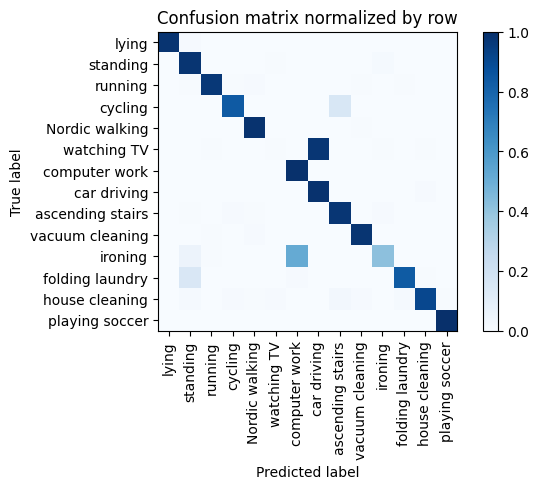

Training Epoch:  87%|████████▋ | 13/15 [06:38<01:00, 30.27s/it]

Overall accuracy: 0.856

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.715      0.995      0.832      0.149        619|	 lying: 0.003,	standing: 0.002,	
         ironing       0.956      0.416      0.580      0.112        466|	 computer work: 0.519,	standing: 0.056,	
           lying       0.995      0.981      0.988      0.091        377|	 standing: 0.011,	playing soccer: 0.003,	
  house cleaning       0.986      0.909      0.946      0.090        375|	 ascending stairs: 0.027,	folding laundry: 0.013,	
        standing       0.840      0.978      0.904      0.089        369|	 ironing: 0.014,	watching TV: 0.005,	
  Nordic walking       0.976      0.986      0.981      0.088        366|	 vacuum cleaning: 0.005,	house cleaning: 0.003,	
         cycling       0.971      0.838      0.899      0.076        315|	 ascending stairs: 0.156,	house cleaning: 0.003,	
 vacuum cleaning       0.977      0.977      0.977      0.074


train: 100%|██████████| 262/262 [00:25<00:00, 10.20batch/s, loss=3.39e+3, accuracy=0.875]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 20.07batch/s, loss=2.99e+3]


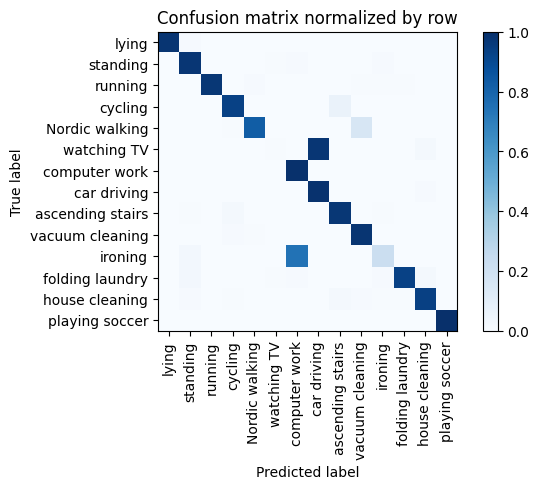

Training Epoch:  93%|█████████▎| 14/15 [07:07<00:29, 29.97s/it]

Overall accuracy: 0.834

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.636      0.995      0.776      0.149        618|	 playing soccer: 0.002,	standing: 0.002,	
         ironing       0.920      0.222      0.358      0.112        464|	 computer work: 0.744,	standing: 0.024,	
  house cleaning       0.978      0.937      0.957      0.092        381|	 ascending stairs: 0.021,	vacuum cleaning: 0.010,	
           lying       0.997      0.979      0.988      0.090        374|	 standing: 0.011,	playing soccer: 0.003,	
        standing       0.927      0.975      0.951      0.088        367|	 computer work: 0.011,	ironing: 0.008,	
  Nordic walking       0.984      0.825      0.897      0.088        366|	 vacuum cleaning: 0.161,	cycling: 0.005,	
         cycling       0.961      0.931      0.946      0.076        317|	 ascending stairs: 0.066,	watching TV: 0.003,	
 vacuum cleaning       0.824      0.977      0.894      0.07


train: 100%|██████████| 262/262 [00:25<00:00, 10.25batch/s, loss=3.43e+3, accuracy=0.906]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 20.04batch/s, loss=3.29e+3]


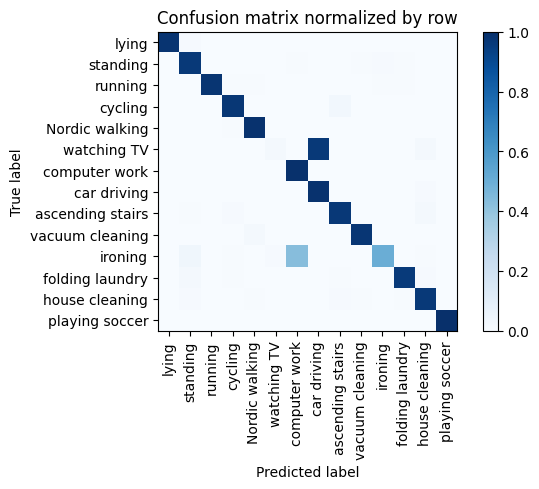

Overall accuracy: 0.886

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.752      0.995      0.857      0.150        622|	 lying: 0.003,	ascending stairs: 0.002,	
         ironing       0.979      0.503      0.665      0.112        465|	 computer work: 0.432,	standing: 0.039,	
  house cleaning       0.966      0.963      0.964      0.091        379|	 ascending stairs: 0.008,	standing: 0.008,	
           lying       0.995      0.981      0.988      0.091        377|	 standing: 0.008,	playing soccer: 0.003,	
  Nordic walking       0.976      0.989      0.982      0.088        365|	 cycling: 0.005,	ascending stairs: 0.003,	
        standing       0.921      0.964      0.942      0.087        364|	 ironing: 0.011,	folding laundry: 0.005,	
         cycling       0.965      0.972      0.968      0.076        316|	 ascending stairs: 0.028,	playing soccer: 0.000,	
 vacuum cleaning       0.984      0.974      0.979      0.074 

unseen: 100%|██████████| 86/86 [00:04<00:00, 19.23batch/s, loss=3.02e+3]


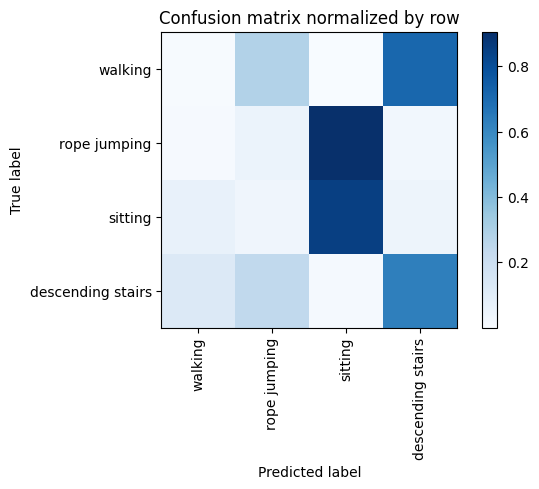

Overall accuracy: 0.391

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.056      0.006      0.011      0.421       2316|	 descending stairs: 0.712,	rope jumping: 0.281,	
          sitting       0.780      0.852      0.815      0.324       1782|	 walking: 0.066,	descending stairs: 0.045,	
descending stairs       0.254      0.627      0.362      0.172        949|	 rope jumping: 0.238,	walking: 0.121,	
     rope jumping       0.027      0.057      0.037      0.083        457|	 sitting: 0.906,	descending stairs: 0.028,	

----------------------------------------------------------------------------------------------------
      avg / total       0.322      0.391      0.334        1.0       5504|	      

{'accuracy': 0.3913517441860465, 'precision': 0.2793052537330893, 'recall': 0.3855816167609555, 'f1': 0.306010574558684}
================ Fold-2 ================
Unseen Classes : ['playing soccer', 'lying', 'vacuum cleani

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 400])



train: 100%|██████████| 242/242 [00:23<00:00, 10.19batch/s, loss=3.03e+3, accuracy=0.375]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.80batch/s, loss=2.99e+3]


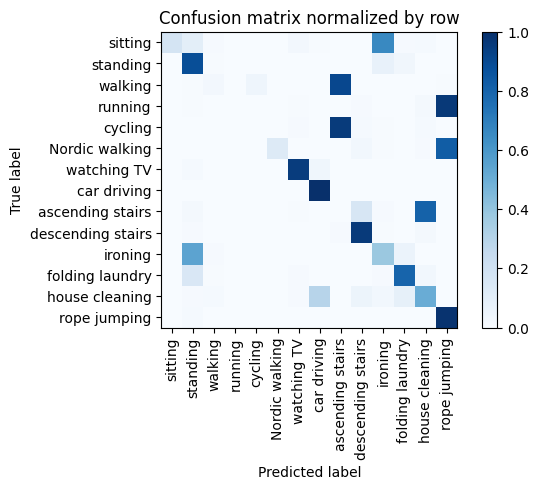

Training Epoch:   7%|▋         | 1/15 [00:27<06:19, 27.11s/it]

Overall accuracy: 0.395

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.412      0.382      0.396      0.130        500|	 standing: 0.546,	folding laundry: 0.060,	
          walking       0.429      0.027      0.050      0.117        448|	 ascending stairs: 0.908,	cycling: 0.045,	
         standing       0.486      0.884      0.627      0.099        380|	 ironing: 0.076,	folding laundry: 0.032,	
   house cleaning       0.478      0.504      0.491      0.094        361|	 car driving: 0.294,	folding laundry: 0.086,	
   Nordic walking       0.979      0.128      0.227      0.093        358|	 rope jumping: 0.827,	descending stairs: 0.028,	
          sitting       1.000      0.179      0.303      0.089        341|	 ironing: 0.660,	standing: 0.100,	
          cycling       0.048      0.003      0.006      0.079        302|	 ascending stairs: 0.954,	house cleaning: 0.013,	descending stairs: 0.013,	
 ascending stairs      


train: 100%|██████████| 242/242 [00:23<00:00, 10.11batch/s, loss=2.92e+3, accuracy=0.328]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.74batch/s, loss=3.14e+3]


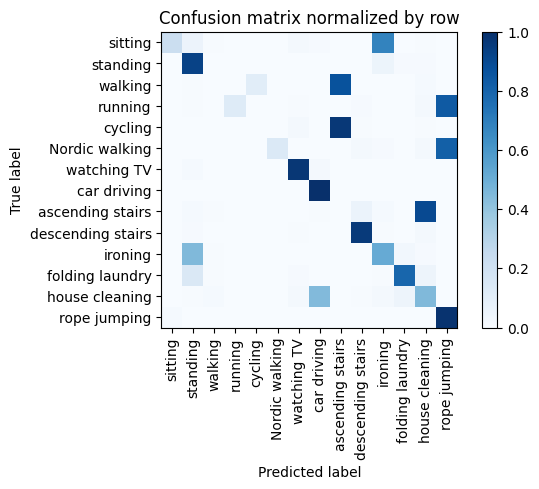

Training Epoch:  13%|█▎        | 2/15 [00:54<05:54, 27.23s/it]

Overall accuracy: 0.418

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.488      0.512      0.500      0.131        502|	 standing: 0.448,	folding laundry: 0.028,	
          walking       0.083      0.002      0.004      0.117        448|	 ascending stairs: 0.868,	cycling: 0.107,	house cleaning: 0.013,	
         standing       0.550      0.928      0.690      0.098        376|	 ironing: 0.053,	house cleaning: 0.008,	
   house cleaning       0.414      0.449      0.431      0.095        363|	 car driving: 0.444,	folding laundry: 0.050,	
   Nordic walking       1.000      0.137      0.241      0.093        357|	 rope jumping: 0.815,	descending stairs: 0.020,	
          sitting       0.987      0.220      0.360      0.090        345|	 ironing: 0.678,	standing: 0.055,	
          cycling       0.000      0.000      0.000      0.079        304|	 ascending stairs: 0.967,	watching TV: 0.016,	house cleaning: 0.007,	
 ascend


train: 100%|██████████| 242/242 [00:23<00:00, 10.16batch/s, loss=2.82e+3, accuracy=0.375]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.81batch/s, loss=3.18e+3]


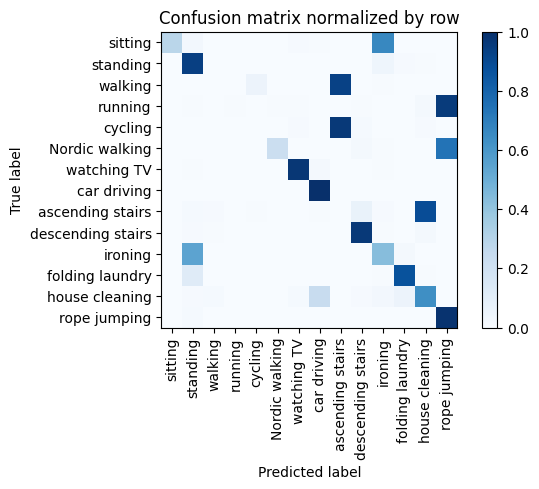

Training Epoch:  20%|██        | 3/15 [01:21<05:26, 27.22s/it]

Overall accuracy: 0.440

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.449      0.431      0.440      0.130        501|	 standing: 0.545,	folding laundry: 0.022,	
          walking       0.091      0.002      0.004      0.117        450|	 ascending stairs: 0.931,	cycling: 0.058,	ironing: 0.004,	
         standing       0.526      0.939      0.674      0.098        378|	 ironing: 0.045,	folding laundry: 0.008,	
   house cleaning       0.526      0.636      0.576      0.095        363|	 car driving: 0.237,	folding laundry: 0.055,	
   Nordic walking       0.988      0.225      0.366      0.093        356|	 rope jumping: 0.742,	descending stairs: 0.017,	
          sitting       1.000      0.289      0.448      0.090        346|	 ironing: 0.662,	standing: 0.026,	
          cycling       0.000      0.000      0.000      0.078        299|	 ascending stairs: 0.963,	descending stairs: 0.013,	house cleaning: 0.010,	
 ascend


train: 100%|██████████| 242/242 [00:24<00:00, 10.08batch/s, loss=3.04e+3, accuracy=0.484]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.26batch/s, loss=2.88e+3]


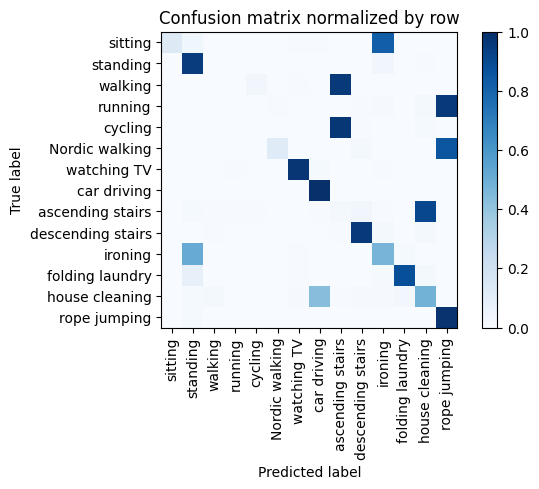

Training Epoch:  27%|██▋       | 4/15 [01:49<05:00, 27.32s/it]

Overall accuracy: 0.409

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.436      0.472      0.454      0.131        502|	 standing: 0.508,	folding laundry: 0.014,	
          walking       0.000      0.000      0.000      0.116        446|	 ascending stairs: 0.957,	cycling: 0.031,	watching TV: 0.004,	
         standing       0.551      0.953      0.698      0.099        379|	 ironing: 0.034,	house cleaning: 0.005,	
   house cleaning       0.442      0.478      0.459      0.093        358|	 car driving: 0.427,	folding laundry: 0.031,	
   Nordic walking       0.955      0.117      0.209      0.093        358|	 rope jumping: 0.852,	descending stairs: 0.017,	
          sitting       1.000      0.129      0.229      0.089        341|	 ironing: 0.818,	standing: 0.035,	
          cycling       0.059      0.003      0.006      0.079        303|	 ascending stairs: 0.970,	house cleaning: 0.013,	descending stairs: 0.007,	
 asc


train: 100%|██████████| 242/242 [00:23<00:00, 10.13batch/s, loss=2.95e+3, accuracy=0.422]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.30batch/s, loss=2.86e+3]


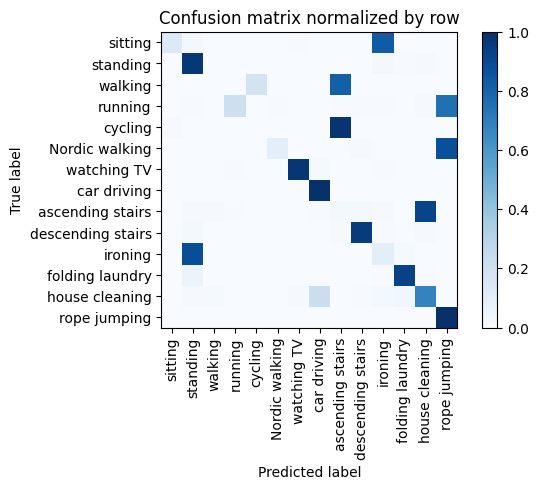

Training Epoch:  33%|███▎      | 5/15 [02:16<04:33, 27.33s/it]

Overall accuracy: 0.393

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.141      0.099      0.117      0.131        503|	 standing: 0.885,	folding laundry: 0.014,	
          walking       0.000      0.000      0.000      0.116        444|	 ascending stairs: 0.813,	cycling: 0.180,	ironing: 0.002,	
         standing       0.434      0.971      0.600      0.098        376|	 ironing: 0.016,	house cleaning: 0.008,	
   house cleaning       0.537      0.677      0.599      0.094        362|	 car driving: 0.227,	folding laundry: 0.039,	
   Nordic walking       0.947      0.101      0.183      0.092        355|	 rope jumping: 0.876,	descending stairs: 0.008,	
          sitting       0.940      0.137      0.239      0.090        344|	 ironing: 0.828,	standing: 0.020,	
          cycling       0.012      0.003      0.005      0.079        305|	 ascending stairs: 0.980,	sitting: 0.010,	house cleaning: 0.003,	
 ascending stairs 


train: 100%|██████████| 242/242 [00:23<00:00, 10.27batch/s, loss=2.82e+3, accuracy=0.344]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.74batch/s, loss=3.04e+3]


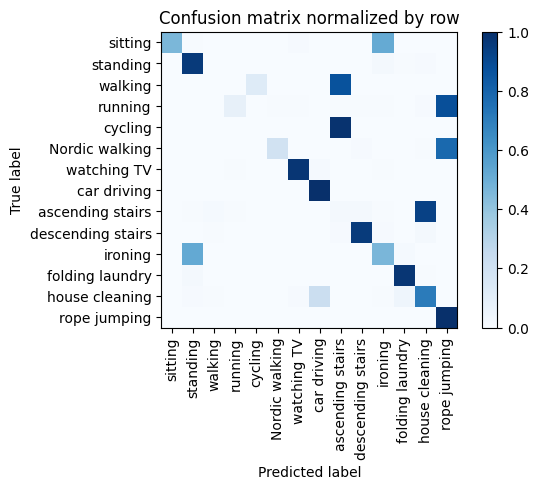

Training Epoch:  40%|████      | 6/15 [02:43<04:05, 27.23s/it]

Overall accuracy: 0.476

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.548      0.463      0.502      0.131        503|	 standing: 0.521,	folding laundry: 0.012,	
          walking       0.111      0.002      0.004      0.117        449|	 ascending stairs: 0.871,	cycling: 0.122,	watching TV: 0.002,	
         standing       0.570      0.960      0.715      0.098        378|	 ironing: 0.021,	house cleaning: 0.011,	
   house cleaning       0.544      0.707      0.615      0.094        362|	 car driving: 0.221,	folding laundry: 0.044,	
   Nordic walking       0.986      0.194      0.324      0.093        356|	 rope jumping: 0.781,	descending stairs: 0.011,	
          sitting       0.994      0.461      0.629      0.089        343|	 ironing: 0.516,	watching TV: 0.012,	
          cycling       0.018      0.003      0.006      0.079        303|	 ascending stairs: 0.987,	house cleaning: 0.003,	watching TV: 0.003,	
 ascend


train: 100%|██████████| 242/242 [00:24<00:00,  9.96batch/s, loss=3.08e+3, accuracy=0.562]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.27batch/s, loss=2.95e+3]


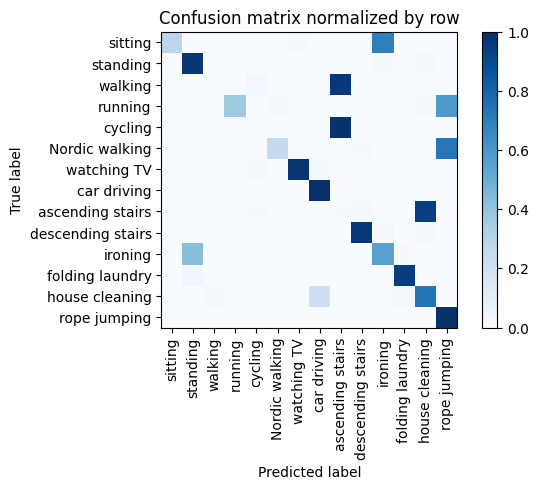

Training Epoch:  47%|████▋     | 7/15 [03:11<03:39, 27.40s/it]

Overall accuracy: 0.495

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.529      0.558      0.543      0.131        504|	 standing: 0.427,	folding laundry: 0.008,	
          walking       0.077      0.002      0.004      0.116        446|	 ascending stairs: 0.966,	cycling: 0.027,	Nordic walking: 0.002,	
         standing       0.618      0.971      0.755      0.098        377|	 ironing: 0.013,	house cleaning: 0.008,	
   house cleaning       0.548      0.730      0.626      0.093        359|	 car driving: 0.212,	walking: 0.022,	
   Nordic walking       0.968      0.258      0.407      0.093        357|	 rope jumping: 0.723,	descending stairs: 0.008,	
          sitting       0.990      0.288      0.446      0.090        344|	 ironing: 0.692,	watching TV: 0.012,	
          cycling       0.000      0.000      0.000      0.079        303|	 ascending stairs: 0.990,	house cleaning: 0.003,	watching TV: 0.003,	
 ascending s


train: 100%|██████████| 242/242 [00:23<00:00, 10.12batch/s, loss=3.14e+3, accuracy=0.484]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.90batch/s, loss=2.87e+3]


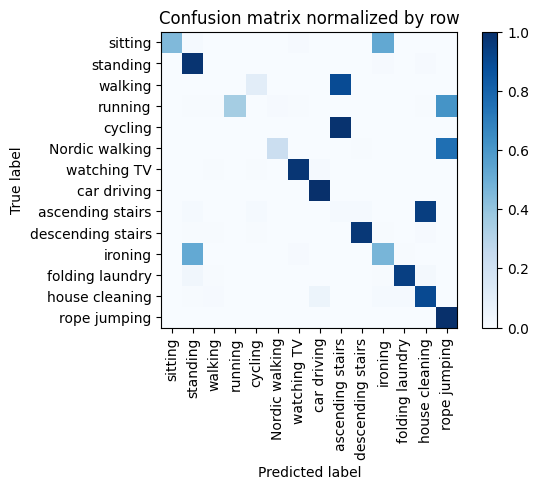

Training Epoch:  53%|█████▎    | 8/15 [03:38<03:11, 27.35s/it]

Overall accuracy: 0.509

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.549      0.466      0.504      0.131        502|	 standing: 0.522,	watching TV: 0.008,	
          walking       0.111      0.002      0.004      0.117        449|	 ascending stairs: 0.891,	cycling: 0.102,	watching TV: 0.002,	
         standing       0.570      0.982      0.721      0.099        380|	 house cleaning: 0.008,	ironing: 0.008,	
   house cleaning       0.601      0.900      0.721      0.094        360|	 car driving: 0.053,	folding laundry: 0.014,	
   Nordic walking       0.976      0.226      0.367      0.093        358|	 rope jumping: 0.757,	descending stairs: 0.006,	
          sitting       0.994      0.448      0.617      0.090        344|	 ironing: 0.526,	standing: 0.015,	
          cycling       0.019      0.003      0.006      0.079        304|	 ascending stairs: 0.987,	house cleaning: 0.003,	watching TV: 0.003,	
 ascending sta


train: 100%|██████████| 242/242 [00:23<00:00, 10.25batch/s, loss=2.91e+3, accuracy=0.453]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.87batch/s, loss=2.98e+3]


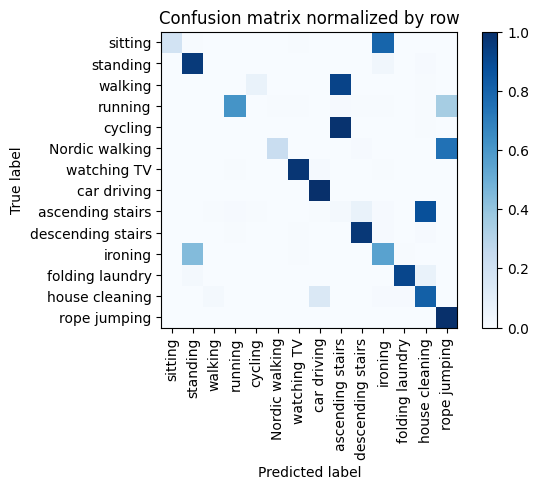

Training Epoch:  60%|██████    | 9/15 [04:05<02:43, 27.23s/it]

Overall accuracy: 0.500

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.484      0.553      0.516      0.131        503|	 standing: 0.439,	folding laundry: 0.004,	
          walking       0.000      0.000      0.000      0.117        448|	 ascending stairs: 0.922,	cycling: 0.069,	house cleaning: 0.007,	
         standing       0.614      0.958      0.749      0.099        381|	 ironing: 0.031,	house cleaning: 0.010,	
   house cleaning       0.577      0.815      0.676      0.094        362|	 car driving: 0.144,	walking: 0.017,	
   Nordic walking       0.988      0.231      0.374      0.092        355|	 rope jumping: 0.749,	descending stairs: 0.008,	
          sitting       1.000      0.186      0.314      0.090        344|	 ironing: 0.797,	watching TV: 0.006,	
          cycling       0.000      0.000      0.000      0.078        301|	 ascending stairs: 0.987,	house cleaning: 0.007,	ironing: 0.003,	
 ascending stair


train: 100%|██████████| 242/242 [00:23<00:00, 10.08batch/s, loss=2.94e+3, accuracy=0.391]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.48batch/s, loss=2.85e+3]


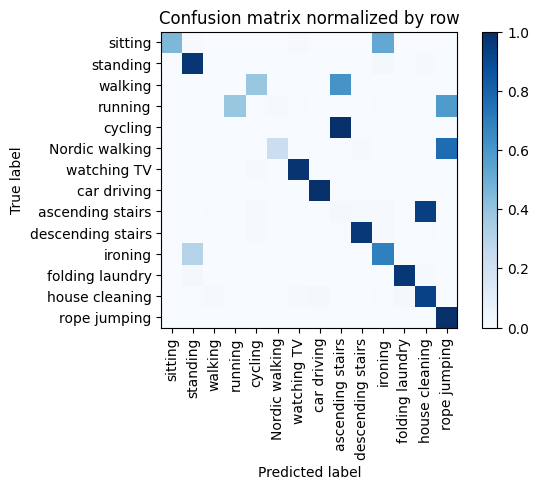

Training Epoch:  67%|██████▋   | 10/15 [04:32<02:16, 27.30s/it]

Overall accuracy: 0.545

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.641      0.688      0.663      0.131        503|	 standing: 0.304,	folding laundry: 0.004,	
          walking       0.143      0.002      0.004      0.117        448|	 ascending stairs: 0.612,	cycling: 0.386,	
         standing       0.693      0.976      0.811      0.097        373|	 ironing: 0.016,	house cleaning: 0.008,	
   house cleaning       0.615      0.934      0.741      0.094        361|	 car driving: 0.019,	folding laundry: 0.017,	
   Nordic walking       0.975      0.220      0.359      0.092        355|	 rope jumping: 0.763,	descending stairs: 0.008,	
          sitting       0.994      0.455      0.624      0.089        343|	 ironing: 0.525,	watching TV: 0.009,	
          cycling       0.000      0.000      0.000      0.079        305|	 ascending stairs: 0.993,	watching TV: 0.003,	sitting: 0.003,	
 ascending stairs       0.007     


train: 100%|██████████| 242/242 [00:23<00:00, 10.21batch/s, loss=3.14e+3, accuracy=0.562]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:02<00:00, 20.09batch/s, loss=2.92e+3]


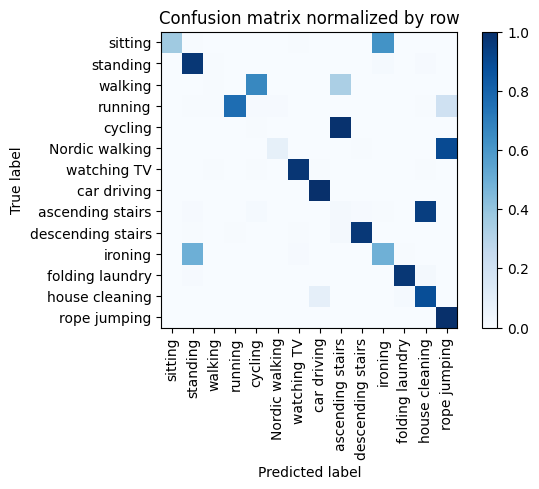

Training Epoch:  73%|███████▎  | 11/15 [04:59<01:48, 27.22s/it]

Overall accuracy: 0.513

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.529      0.492      0.510      0.131        502|	 standing: 0.494,	watching TV: 0.008,	
          walking       0.250      0.004      0.009      0.116        447|	 cycling: 0.662,	ascending stairs: 0.333,	
         standing       0.586      0.971      0.731      0.098        376|	 ironing: 0.013,	house cleaning: 0.008,	
   house cleaning       0.600      0.884      0.714      0.094        361|	 car driving: 0.089,	folding laundry: 0.014,	
   Nordic walking       0.938      0.084      0.155      0.093        356|	 rope jumping: 0.896,	descending stairs: 0.006,	
          sitting       0.992      0.369      0.538      0.090        344|	 ironing: 0.619,	watching TV: 0.006,	
          cycling       0.007      0.007      0.007      0.080        306|	 ascending stairs: 0.990,	sitting: 0.003,	
 ascending stairs       0.009      0.019      0.012      0


train: 100%|██████████| 242/242 [00:23<00:00, 10.25batch/s, loss=3.07e+3, accuracy=0.531]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.40batch/s, loss=3.03e+3]


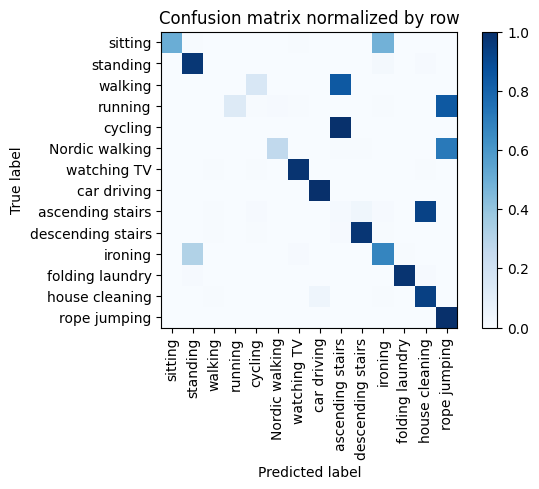

Training Epoch:  80%|████████  | 12/15 [05:26<01:21, 27.17s/it]

Overall accuracy: 0.538

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.653      0.670      0.661      0.130        500|	 standing: 0.316,	watching TV: 0.008,	
          walking       0.167      0.002      0.004      0.117        449|	 ascending stairs: 0.842,	cycling: 0.154,	house cleaning: 0.002,	
         standing       0.691      0.971      0.807      0.098        375|	 ironing: 0.019,	house cleaning: 0.008,	
   house cleaning       0.619      0.937      0.745      0.095        364|	 car driving: 0.044,	ironing: 0.005,	
   Nordic walking       0.979      0.263      0.414      0.093        358|	 rope jumping: 0.718,	descending stairs: 0.006,	
          sitting       0.994      0.500      0.665      0.089        342|	 ironing: 0.482,	watching TV: 0.006,	
          cycling       0.013      0.003      0.005      0.079        302|	 ascending stairs: 0.993,	sitting: 0.003,	
 ascending stairs       0.004      0.014   


train: 100%|██████████| 242/242 [00:23<00:00, 10.12batch/s, loss=2.99e+3, accuracy=0.625]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 18.99batch/s, loss=2.99e+3]


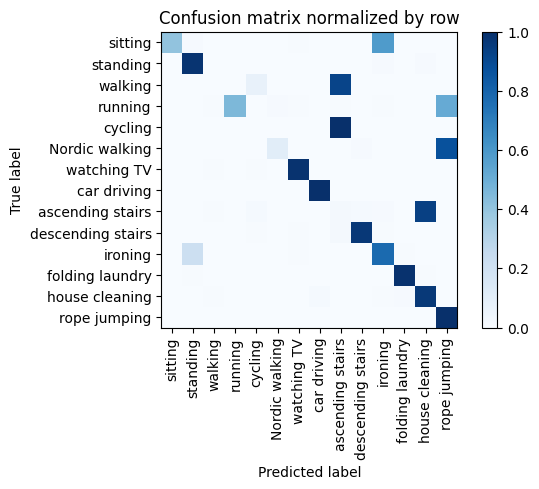

Training Epoch:  87%|████████▋ | 13/15 [05:54<00:54, 27.25s/it]

Overall accuracy: 0.550

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.652      0.774      0.707      0.130        500|	 standing: 0.216,	watching TV: 0.006,	
          walking       0.000      0.000      0.000      0.116        445|	 ascending stairs: 0.921,	cycling: 0.076,	running: 0.002,	
         standing       0.768      0.984      0.863      0.099        381|	 house cleaning: 0.008,	ironing: 0.008,	
   house cleaning       0.627      0.961      0.759      0.094        360|	 car driving: 0.014,	folding laundry: 0.011,	
   Nordic walking       0.950      0.107      0.192      0.092        355|	 rope jumping: 0.873,	descending stairs: 0.008,	
          sitting       0.993      0.403      0.573      0.089        340|	 ironing: 0.582,	standing: 0.009,	
          cycling       0.000      0.000      0.000      0.080        307|	 ascending stairs: 0.997,	sitting: 0.003,	rope jumping: 0.000,	
 ascending stairs       


train: 100%|██████████| 242/242 [00:24<00:00,  9.91batch/s, loss=3.07e+3, accuracy=0.578]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 18.06batch/s, loss=3e+3]   


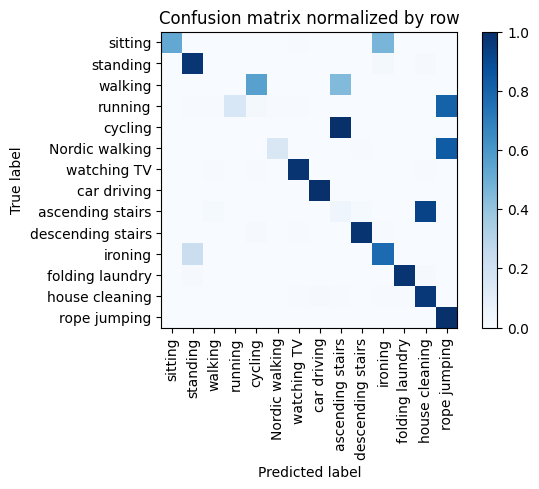

Training Epoch:  93%|█████████▎| 14/15 [06:22<00:27, 27.50s/it]

Overall accuracy: 0.551

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.694      0.772      0.731      0.130        499|	 standing: 0.226,	watching TV: 0.002,	
          walking       0.000      0.000      0.000      0.116        444|	 cycling: 0.556,	ascending stairs: 0.444,	rope jumping: 0.000,	
         standing       0.760      0.976      0.855      0.099        379|	 ironing: 0.016,	house cleaning: 0.008,	
   house cleaning       0.630      0.967      0.763      0.094        361|	 car driving: 0.008,	folding laundry: 0.006,	
   Nordic walking       0.982      0.152      0.263      0.093        356|	 rope jumping: 0.831,	descending stairs: 0.006,	
          sitting       0.995      0.526      0.688      0.090        344|	 ironing: 0.465,	watching TV: 0.006,	
          cycling       0.000      0.000      0.000      0.080        307|	 ascending stairs: 0.997,	sitting: 0.003,	rope jumping: 0.000,	
 ascending stair


train: 100%|██████████| 242/242 [00:24<00:00,  9.85batch/s, loss=2.9e+3, accuracy=0.578]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 18.81batch/s, loss=2.87e+3]


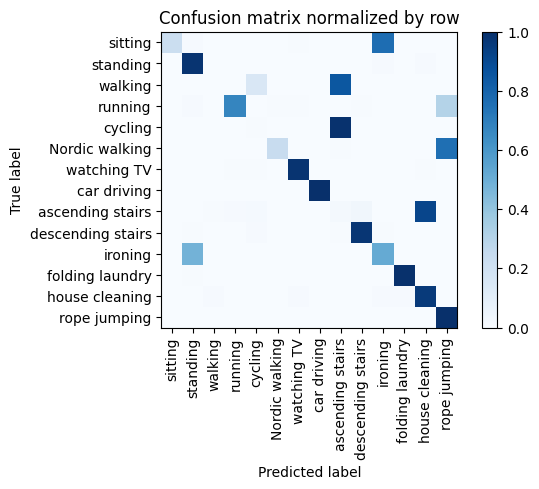

Overall accuracy: 0.520

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.488      0.518      0.502      0.130        500|	 standing: 0.480,	watching TV: 0.002,	
          walking       0.000      0.000      0.000      0.117        451|	 ascending stairs: 0.851,	cycling: 0.149,	rope jumping: 0.000,	
         standing       0.597      0.981      0.742      0.098        376|	 ironing: 0.011,	house cleaning: 0.008,	
   house cleaning       0.628      0.958      0.759      0.093        358|	 ironing: 0.011,	folding laundry: 0.008,	
   Nordic walking       0.988      0.235      0.379      0.093        358|	 rope jumping: 0.754,	ascending stairs: 0.006,	
          sitting       0.987      0.221      0.361      0.090        344|	 ironing: 0.765,	standing: 0.009,	
          cycling       0.027      0.007      0.011      0.079        305|	 ascending stairs: 0.990,	sitting: 0.003,	
 ascending stairs       0.007      0.023     

unseen: 100%|██████████| 111/111 [00:05<00:00, 20.20batch/s, loss=3.88e+3]


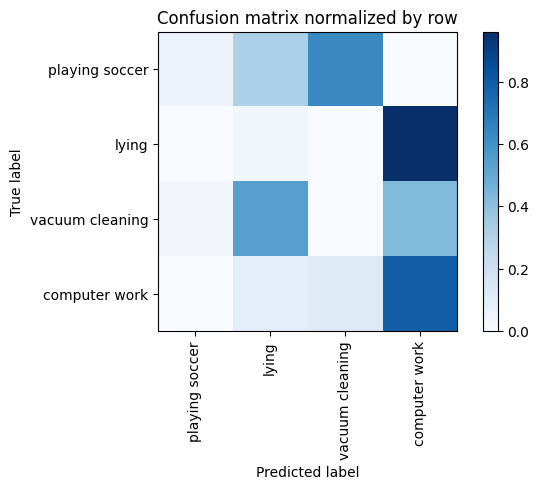

Overall accuracy: 0.355

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.490      0.789      0.604      0.432       3071|	 vacuum cleaning: 0.120,	lying: 0.091,	
          lying       0.046      0.035      0.040      0.264       1874|	 computer work: 0.960,	playing soccer: 0.004,	
vacuum cleaning       0.015      0.006      0.008      0.240       1704|	 lying: 0.536,	computer work: 0.424,	playing soccer: 0.033,	
 playing soccer       0.275      0.055      0.092      0.064        455|	 vacuum cleaning: 0.629,	lying: 0.316,	

----------------------------------------------------------------------------------------------------
    avg / total       0.245      0.355      0.280        1.0       7104|	      

{'accuracy': 0.35501126126126126, 'precision': 0.206494374457876, 'recall': 0.22104173780652495, 'f1': 0.18601706587369068}
================ Fold-3 ================
Unseen Classes : ['cycling', 'running', 'Nordic walking'

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([15, 400])



train: 100%|██████████| 276/276 [00:27<00:00,  9.87batch/s, loss=3.17e+3, accuracy=0.641]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 19.94batch/s, loss=3.51e+3]


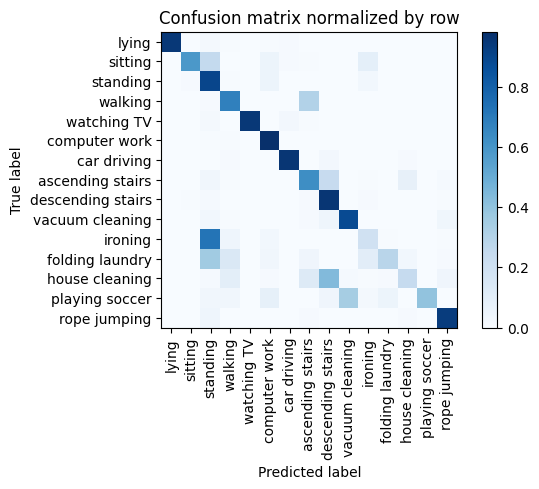

Training Epoch:   7%|▋         | 1/15 [00:31<07:25, 31.81s/it]

Overall accuracy: 0.696

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.896      0.982      0.937      0.139        613|	 walking: 0.005,	standing: 0.005,	
          ironing       0.564      0.192      0.287      0.108        478|	 standing: 0.722,	walking: 0.046,	
          walking       0.759      0.677      0.716      0.099        437|	 ascending stairs: 0.304,	standing: 0.011,	
          sitting       0.978      0.587      0.734      0.086        380|	 standing: 0.250,	ironing: 0.089,	
         standing       0.376      0.898      0.530      0.084        372|	 computer work: 0.051,	ironing: 0.030,	
            lying       0.997      0.949      0.972      0.084        372|	 standing: 0.022,	car driving: 0.008,	
  vacuum cleaning       0.891      0.881      0.886      0.084        371|	 descending stairs: 0.043,	rope jumping: 0.035,	
   house cleaning       0.743      0.243      0.366      0.076        334|	 desc


train: 100%|██████████| 276/276 [00:27<00:00,  9.93batch/s, loss=3.3e+3, accuracy=0.641]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 18.36batch/s, loss=3.55e+3]


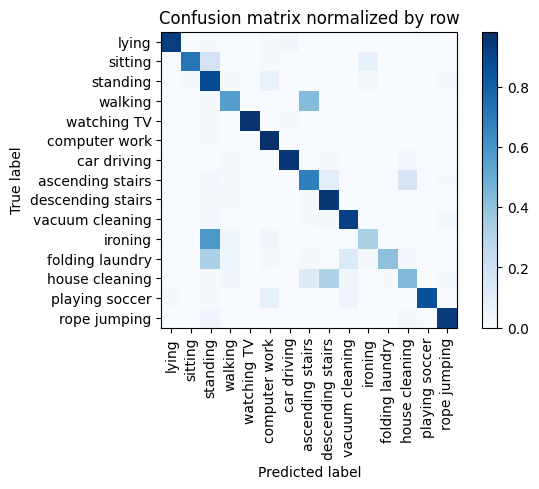

Training Epoch:  13%|█▎        | 2/15 [01:03<06:54, 31.87s/it]

Overall accuracy: 0.744

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.906      0.984      0.943      0.139        614|	 standing: 0.008,	ascending stairs: 0.003,	
          ironing       0.789      0.329      0.464      0.108        477|	 standing: 0.589,	walking: 0.038,	
          walking       0.824      0.558      0.666      0.099        437|	 ascending stairs: 0.426,	standing: 0.009,	
          sitting       0.986      0.717      0.830      0.086        381|	 standing: 0.178,	ironing: 0.071,	
            lying       0.991      0.933      0.961      0.084        373|	 car driving: 0.032,	standing: 0.011,	
         standing       0.420      0.881      0.569      0.084        370|	 computer work: 0.068,	ironing: 0.019,	
  vacuum cleaning       0.885      0.921      0.903      0.084        369|	 standing: 0.027,	rope jumping: 0.019,	
   house cleaning       0.750      0.440      0.555      0.076        334|	 desc


train: 100%|██████████| 276/276 [00:27<00:00, 10.17batch/s, loss=3.55e+3, accuracy=0.625]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 18.24batch/s, loss=3.52e+3]


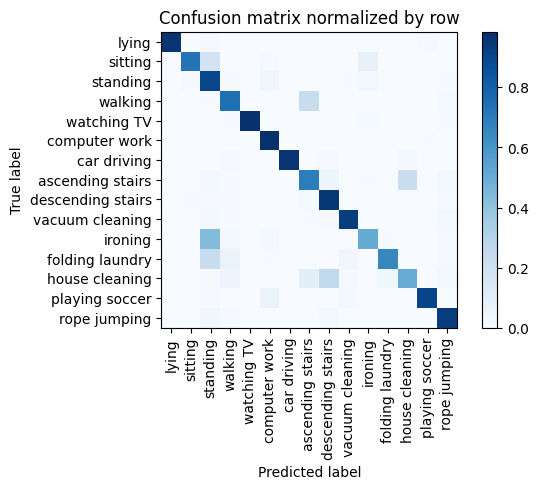

Training Epoch:  20%|██        | 3/15 [01:34<06:19, 31.60s/it]

Overall accuracy: 0.805

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.945      0.985      0.965      0.139        613|	 playing soccer: 0.005,	ascending stairs: 0.003,	
          ironing       0.850      0.508      0.636      0.108        478|	 standing: 0.433,	walking: 0.023,	
          walking       0.867      0.744      0.800      0.099        437|	 ascending stairs: 0.233,	rope jumping: 0.014,	
          sitting       0.986      0.728      0.837      0.087        382|	 standing: 0.181,	ironing: 0.073,	
         standing       0.493      0.903      0.638      0.084        372|	 computer work: 0.038,	ironing: 0.030,	
            lying       0.994      0.968      0.981      0.084        372|	 standing: 0.011,	playing soccer: 0.008,	
  vacuum cleaning       0.956      0.935      0.945      0.084        370|	 rope jumping: 0.024,	standing: 0.019,	
   house cleaning       0.763      0.502      0.605      0.075     


train: 100%|██████████| 276/276 [00:27<00:00, 10.12batch/s, loss=3.47e+3, accuracy=0.766]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 18.86batch/s, loss=3.49e+3]


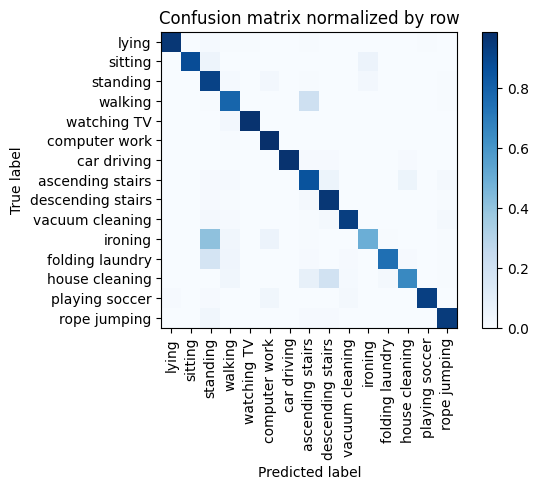

Training Epoch:  27%|██▋       | 4/15 [02:06<05:46, 31.48s/it]

Overall accuracy: 0.846

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.937      0.989      0.962      0.139        614|	 walking: 0.005,	playing soccer: 0.003,	
          ironing       0.880      0.492      0.631      0.108        478|	 standing: 0.406,	computer work: 0.056,	
          walking       0.860      0.788      0.822      0.099        438|	 ascending stairs: 0.201,	rope jumping: 0.007,	
          sitting       0.997      0.879      0.934      0.086        381|	 ironing: 0.058,	standing: 0.050,	
            lying       0.992      0.960      0.976      0.085        374|	 standing: 0.013,	playing soccer: 0.005,	
         standing       0.558      0.916      0.694      0.084        370|	 ironing: 0.027,	computer work: 0.027,	
  vacuum cleaning       0.974      0.932      0.953      0.083        368|	 rope jumping: 0.022,	descending stairs: 0.016,	
   house cleaning       0.935      0.650      0.767      0.07


train: 100%|██████████| 276/276 [00:27<00:00, 10.04batch/s, loss=3.42e+3, accuracy=0.844]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 18.81batch/s, loss=3.6e+3]


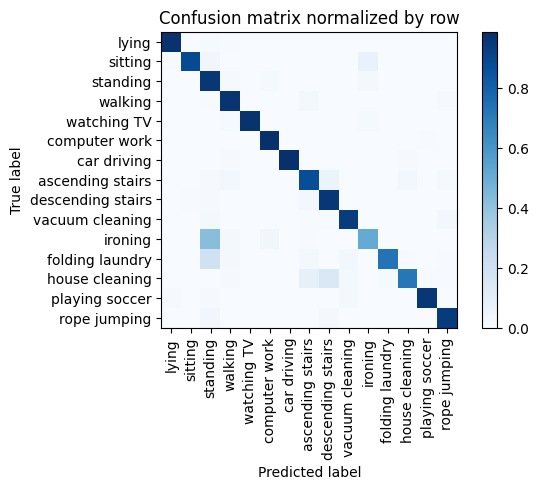

Training Epoch:  33%|███▎      | 5/15 [02:37<05:14, 31.49s/it]

Overall accuracy: 0.877

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.965      0.987      0.976      0.139        615|	 playing soccer: 0.005,	ascending stairs: 0.003,	
          ironing       0.879      0.512      0.647      0.109        480|	 standing: 0.421,	computer work: 0.033,	
          walking       0.930      0.970      0.950      0.099        437|	 ascending stairs: 0.016,	rope jumping: 0.009,	
          sitting       0.997      0.883      0.937      0.085        377|	 ironing: 0.069,	standing: 0.032,	
            lying       0.989      0.973      0.981      0.084        372|	 standing: 0.013,	walking: 0.005,	
         standing       0.564      0.957      0.710      0.084        371|	 ironing: 0.016,	computer work: 0.013,	
  vacuum cleaning       0.961      0.940      0.951      0.084        369|	 rope jumping: 0.027,	standing: 0.019,	
   house cleaning       0.956      0.713      0.817      0.076      


train: 100%|██████████| 276/276 [00:28<00:00,  9.86batch/s, loss=3.54e+3, accuracy=0.828]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 17.99batch/s, loss=3.56e+3]


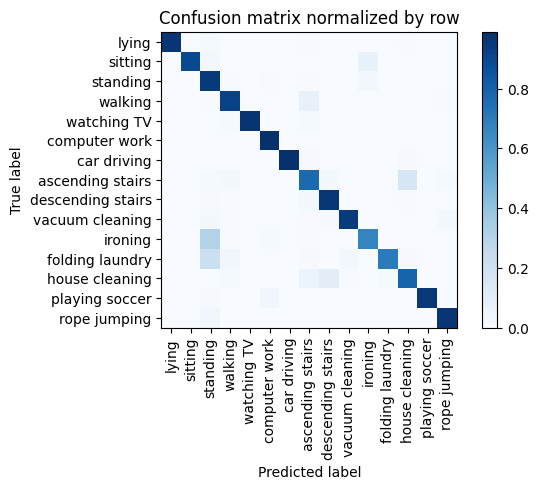

Training Epoch:  40%|████      | 6/15 [03:10<04:45, 31.73s/it]

Overall accuracy: 0.890

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.979      0.990      0.985      0.139        613|	 playing soccer: 0.003,	walking: 0.003,	
          ironing       0.896      0.667      0.764      0.108        477|	 standing: 0.306,	computer work: 0.013,	
          walking       0.937      0.918      0.927      0.099        438|	 ascending stairs: 0.073,	rope jumping: 0.005,	
          sitting       0.994      0.892      0.941      0.086        381|	 ironing: 0.068,	standing: 0.026,	
            lying       0.994      0.965      0.980      0.085        374|	 standing: 0.013,	house cleaning: 0.005,	
  vacuum cleaning       0.978      0.946      0.962      0.084        371|	 rope jumping: 0.019,	standing: 0.016,	
         standing       0.618      0.951      0.749      0.084        371|	 ironing: 0.030,	ascending stairs: 0.005,	
   house cleaning       0.863      0.793      0.826      0.075     


train: 100%|██████████| 276/276 [00:26<00:00, 10.24batch/s, loss=3.29e+3, accuracy=0.797]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 18.59batch/s, loss=3.52e+3]


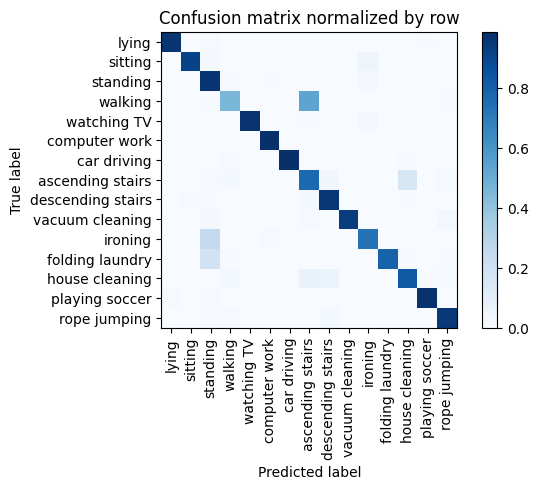

Training Epoch:  47%|████▋     | 7/15 [03:41<04:11, 31.49s/it]

Overall accuracy: 0.860

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.989      0.989      0.989      0.139        613|	 playing soccer: 0.003,	ascending stairs: 0.003,	
          ironing       0.919      0.732      0.815      0.108        478|	 standing: 0.257,	computer work: 0.008,	
          walking       0.912      0.452      0.604      0.099        436|	 ascending stairs: 0.537,	rope jumping: 0.005,	
          sitting       0.994      0.914      0.952      0.087        382|	 ironing: 0.050,	standing: 0.021,	
            lying       0.992      0.971      0.981      0.085        374|	 standing: 0.011,	playing soccer: 0.005,	
         standing       0.662      0.968      0.786      0.084        371|	 ironing: 0.016,	walking: 0.008,	
  vacuum cleaning       1.000      0.941      0.969      0.084        370|	 rope jumping: 0.030,	standing: 0.016,	
   house cleaning       0.871      0.826      0.848      0.076     


train: 100%|██████████| 276/276 [00:28<00:00,  9.85batch/s, loss=3.34e+3, accuracy=0.797]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 19.16batch/s, loss=3.54e+3]


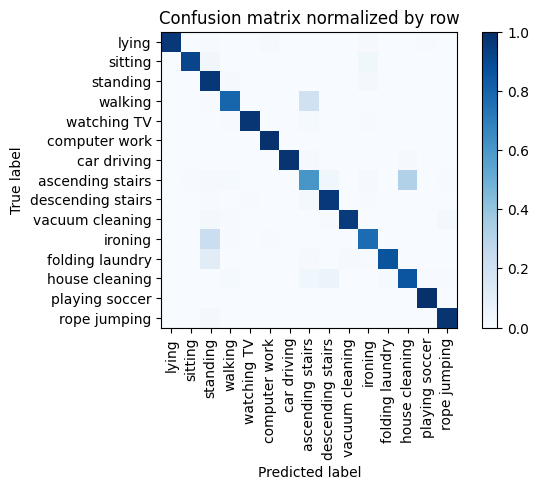

Training Epoch:  53%|█████▎    | 8/15 [04:12<03:41, 31.65s/it]

Overall accuracy: 0.898

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.989      0.992      0.990      0.139        614|	 playing soccer: 0.003,	ascending stairs: 0.003,	
          ironing       0.927      0.768      0.840      0.108        478|	 standing: 0.222,	computer work: 0.004,	
          walking       0.954      0.795      0.867      0.099        439|	 ascending stairs: 0.198,	standing: 0.005,	
          sitting       0.994      0.916      0.954      0.086        381|	 ironing: 0.037,	standing: 0.031,	
            lying       0.994      0.968      0.981      0.084        372|	 ironing: 0.008,	computer work: 0.008,	
         standing       0.700      0.970      0.814      0.084        371|	 ironing: 0.016,	walking: 0.011,	
  vacuum cleaning       0.992      0.954      0.972      0.084        369|	 rope jumping: 0.019,	standing: 0.016,	
   house cleaning       0.802      0.859      0.829      0.076        334


train: 100%|██████████| 276/276 [00:27<00:00,  9.95batch/s, loss=3.35e+3, accuracy=0.75]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 18.84batch/s, loss=3.47e+3]


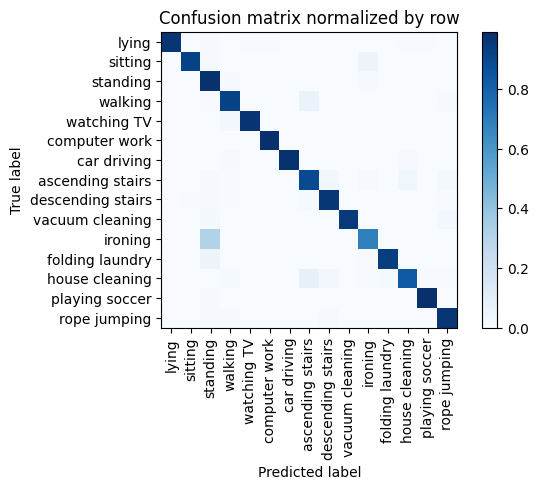

Training Epoch:  60%|██████    | 9/15 [04:44<03:10, 31.68s/it]

Overall accuracy: 0.918

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.992      0.993      0.139        613|	 playing soccer: 0.003,	ascending stairs: 0.002,	
          ironing       0.919      0.688      0.787      0.109        480|	 standing: 0.310,	ascending stairs: 0.002,	
          walking       0.952      0.922      0.937      0.098        434|	 ascending stairs: 0.065,	rope jumping: 0.009,	
          sitting       0.997      0.921      0.958      0.087        382|	 ironing: 0.055,	standing: 0.010,	
            lying       0.994      0.968      0.981      0.084        372|	 standing: 0.008,	playing soccer: 0.005,	
  vacuum cleaning       0.997      0.951      0.974      0.084        370|	 rope jumping: 0.027,	standing: 0.016,	
         standing       0.666      0.981      0.793      0.084        370|	 ironing: 0.008,	walking: 0.008,	
   house cleaning       0.959      0.835      0.893      0.076  


train: 100%|██████████| 276/276 [00:27<00:00, 10.08batch/s, loss=3.31e+3, accuracy=0.891]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 18.51batch/s, loss=3.42e+3]


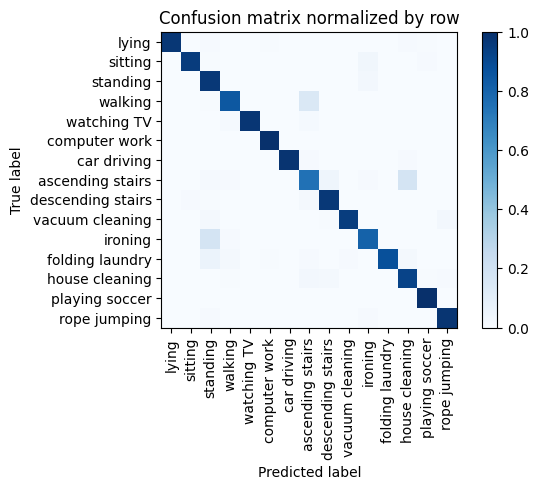

Training Epoch:  67%|██████▋   | 10/15 [05:16<02:38, 31.62s/it]

Overall accuracy: 0.922

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.993      0.993      0.138        611|	 playing soccer: 0.003,	walking: 0.003,	
          ironing       0.939      0.808      0.869      0.108        479|	 standing: 0.177,	walking: 0.008,	
          walking       0.956      0.844      0.896      0.099        436|	 ascending stairs: 0.147,	standing: 0.005,	
          sitting       0.989      0.950      0.969      0.086        380|	 ironing: 0.032,	playing soccer: 0.008,	
         standing       0.757      0.965      0.849      0.084        372|	 ironing: 0.027,	rope jumping: 0.003,	
            lying       0.997      0.970      0.984      0.084        371|	 house cleaning: 0.008,	standing: 0.008,	
  vacuum cleaning       0.994      0.949      0.971      0.084        370|	 rope jumping: 0.024,	standing: 0.016,	
   house cleaning       0.873      0.925      0.898      0.076        334|	


train: 100%|██████████| 276/276 [00:28<00:00,  9.81batch/s, loss=3.4e+3, accuracy=0.891]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 18.42batch/s, loss=3.55e+3]


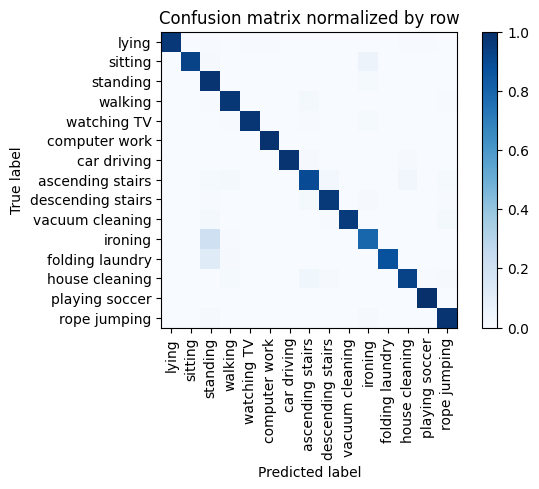

Training Epoch:  73%|███████▎  | 11/15 [05:48<02:07, 31.80s/it]

Overall accuracy: 0.939

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.993      0.992      0.993      0.138        611|	 playing soccer: 0.003,	walking: 0.003,	
          ironing       0.922      0.789      0.850      0.108        479|	 standing: 0.205,	walking: 0.004,	
          walking       0.964      0.973      0.968      0.099        438|	 ascending stairs: 0.016,	rope jumping: 0.007,	
          sitting       1.000      0.924      0.960      0.086        380|	 ironing: 0.055,	standing: 0.008,	
            lying       1.000      0.968      0.984      0.084        373|	 playing soccer: 0.005,	house cleaning: 0.005,	
  vacuum cleaning       1.000      0.954      0.977      0.084        371|	 rope jumping: 0.019,	standing: 0.019,	
         standing       0.722      0.981      0.832      0.084        370|	 ironing: 0.014,	rope jumping: 0.003,	
   house cleaning       0.966      0.922      0.943      0.076        3


train: 100%|██████████| 276/276 [00:27<00:00,  9.98batch/s, loss=3.36e+3, accuracy=0.875]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 18.23batch/s, loss=3.5e+3] 


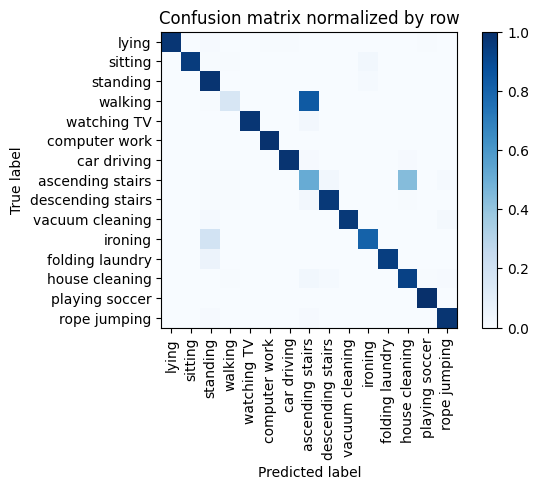

Training Epoch:  80%|████████  | 12/15 [06:20<01:35, 31.80s/it]

Overall accuracy: 0.849

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.992      0.993      0.139        613|	 playing soccer: 0.003,	ascending stairs: 0.003,	
          ironing       0.960      0.808      0.877      0.108        478|	 standing: 0.186,	ascending stairs: 0.002,	
          walking       0.908      0.158      0.269      0.099        437|	 ascending stairs: 0.838,	standing: 0.005,	
          sitting       1.000      0.950      0.974      0.086        379|	 ironing: 0.029,	walking: 0.005,	
            lying       0.995      0.973      0.984      0.085        374|	 standing: 0.008,	playing soccer: 0.005,	
  vacuum cleaning       1.000      0.962      0.981      0.084        371|	 rope jumping: 0.019,	standing: 0.013,	
         standing       0.759      0.984      0.857      0.084        371|	 ironing: 0.013,	rope jumping: 0.003,	
   house cleaning       0.761      0.931      0.838      0.076  


train: 100%|██████████| 276/276 [00:27<00:00, 10.06batch/s, loss=3.44e+3, accuracy=0.812]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 19.09batch/s, loss=3.27e+3]


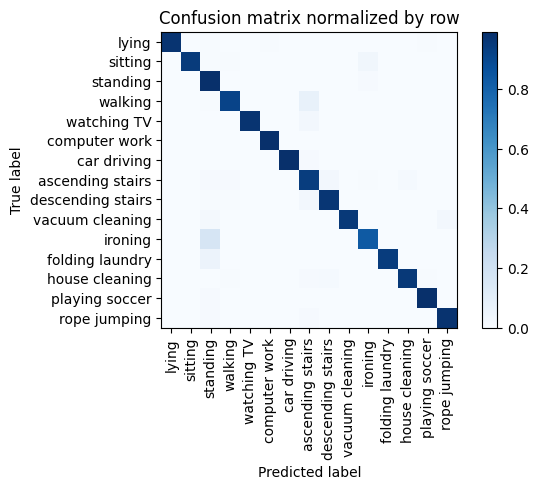

Training Epoch:  87%|████████▋ | 13/15 [06:51<01:03, 31.69s/it]

Overall accuracy: 0.949

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.992      0.994      0.139        614|	 playing soccer: 0.003,	walking: 0.003,	
          ironing       0.957      0.833      0.891      0.108        479|	 standing: 0.163,	ascending stairs: 0.002,	
          walking       0.976      0.918      0.946      0.099        439|	 ascending stairs: 0.075,	standing: 0.005,	
          sitting       1.000      0.947      0.973      0.086        380|	 ironing: 0.034,	walking: 0.005,	
            lying       0.997      0.973      0.985      0.084        373|	 playing soccer: 0.005,	computer work: 0.005,	
         standing       0.776      0.992      0.871      0.084        371|	 ironing: 0.008,	rope jumping: 0.000,	
  vacuum cleaning       1.000      0.954      0.976      0.084        370|	 rope jumping: 0.024,	standing: 0.016,	
   house cleaning       0.984      0.955      0.969      0.075      


train: 100%|██████████| 276/276 [00:28<00:00,  9.77batch/s, loss=3.58e+3, accuracy=0.922]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 19.11batch/s, loss=3.32e+3]


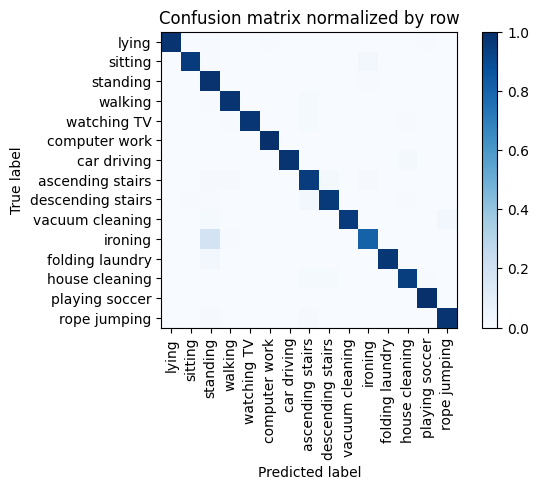

Training Epoch:  93%|█████████▎| 14/15 [07:23<00:31, 31.84s/it]

Overall accuracy: 0.955

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.993      0.994      0.139        615|	 playing soccer: 0.003,	ascending stairs: 0.002,	
          ironing       0.963      0.808      0.879      0.109        480|	 standing: 0.183,	walking: 0.004,	
          walking       0.979      0.977      0.978      0.099        435|	 ascending stairs: 0.014,	standing: 0.005,	
          sitting       0.995      0.955      0.974      0.086        379|	 ironing: 0.026,	standing: 0.005,	
  vacuum cleaning       0.997      0.957      0.977      0.084        371|	 rope jumping: 0.024,	standing: 0.013,	
            lying       0.995      0.981      0.988      0.084        371|	 playing soccer: 0.005,	computer work: 0.005,	
         standing       0.772      0.986      0.866      0.084        370|	 ironing: 0.005,	rope jumping: 0.003,	
   house cleaning       0.988      0.949      0.968      0.076     


train: 100%|██████████| 276/276 [00:27<00:00,  9.95batch/s, loss=3.31e+3, accuracy=0.844]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 18.10batch/s, loss=3.35e+3]


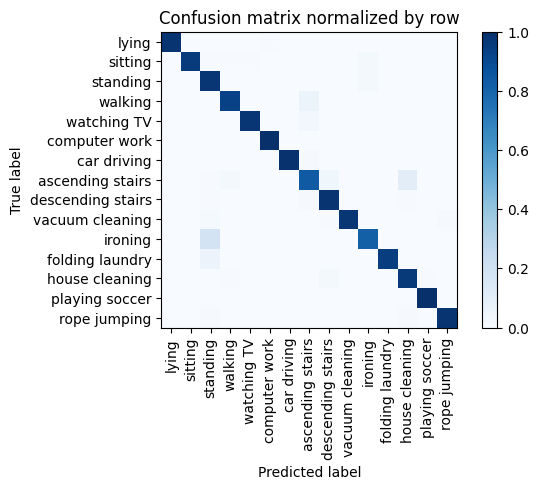

Overall accuracy: 0.947

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.993      0.994      0.139        613|	 playing soccer: 0.002,	ascending stairs: 0.002,	
          ironing       0.963      0.812      0.881      0.109        480|	 standing: 0.183,	ascending stairs: 0.002,	
          walking       0.976      0.933      0.954      0.099        436|	 ascending stairs: 0.060,	rope jumping: 0.002,	
          sitting       1.000      0.955      0.977      0.086        380|	 ironing: 0.021,	watching TV: 0.005,	
         standing       0.767      0.973      0.858      0.084        372|	 ironing: 0.019,	rope jumping: 0.003,	
            lying       0.992      0.984      0.988      0.084        371|	 computer work: 0.005,	playing soccer: 0.003,	
  vacuum cleaning       1.000      0.973      0.986      0.084        370|	 standing: 0.014,	rope jumping: 0.008,	
   house cleaning       0.930      0.961      0.946

unseen: 100%|██████████| 68/68 [00:03<00:00, 18.70batch/s, loss=2.23e+3]


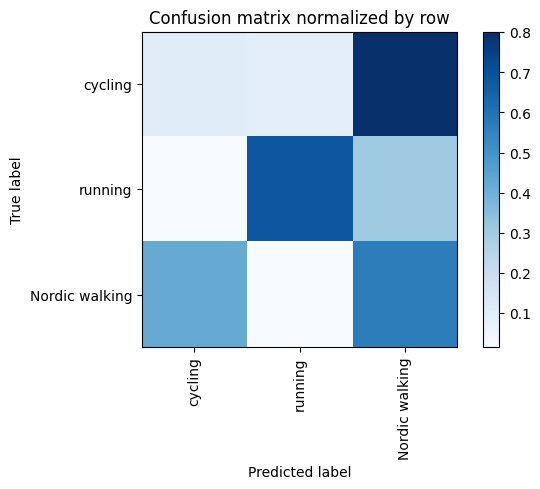

Overall accuracy: 0.422

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.397      0.565      0.467      0.418       1820|	 cycling: 0.419,	running: 0.015,	
       cycling       0.178      0.105      0.132      0.366       1593|	 Nordic walking: 0.802,	running: 0.093,	
       running       0.785      0.683      0.730      0.216        939|	 Nordic walking: 0.304,	cycling: 0.014,	

----------------------------------------------------------------------------------------------------
   avg / total       0.401      0.422      0.401        1.0       4352|	      

{'accuracy': 0.42233455882352944, 'precision': 0.4532292616447286, 'recall': 0.45116237218094585, 'f1': 0.44302303243805374}
================ Fold-4 ================
Unseen Classes : ['ironing', 'car driving', 'folding laundry']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([15, 400])



train: 100%|██████████| 283/283 [00:28<00:00, 10.07batch/s, loss=3.28e+3, accuracy=0.781]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.78batch/s, loss=3.16e+3]


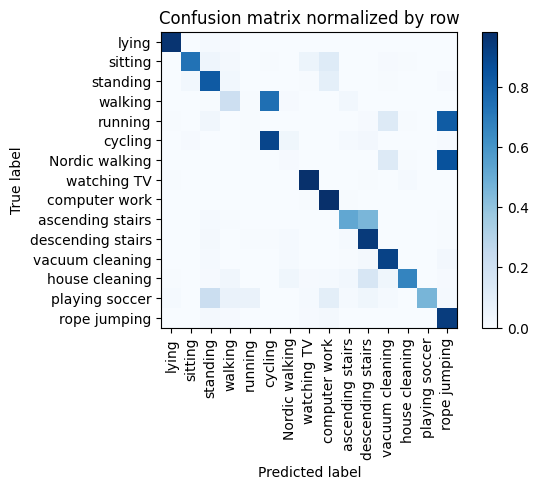

Training Epoch:   7%|▋         | 1/15 [00:32<07:30, 32.18s/it]

Overall accuracy: 0.683

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.867      0.982      0.921      0.140        625|	 ascending stairs: 0.005,	watching TV: 0.005,	
          walking       0.679      0.207      0.318      0.098        439|	 cycling: 0.743,	ascending stairs: 0.027,	
         standing       0.836      0.823      0.830      0.088        396|	 computer work: 0.091,	sitting: 0.030,	
   house cleaning       0.961      0.662      0.784      0.083        373|	 descending stairs: 0.158,	vacuum cleaning: 0.038,	
            lying       0.986      0.965      0.976      0.083        372|	 standing: 0.013,	walking: 0.011,	
   Nordic walking       0.071      0.009      0.015      0.077        347|	 rope jumping: 0.853,	vacuum cleaning: 0.127,	
          cycling       0.484      0.899      0.629      0.077        347|	 Nordic walking: 0.035,	descending stairs: 0.023,	
          sitting       0.939      0.729  


train: 100%|██████████| 283/283 [00:27<00:00, 10.20batch/s, loss=3.05e+3, accuracy=0.578]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.16batch/s, loss=3.23e+3]


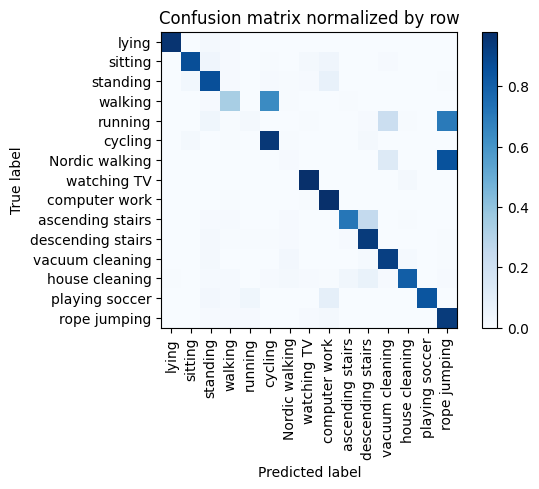

Training Epoch:  13%|█▎        | 2/15 [01:04<06:56, 32.05s/it]

Overall accuracy: 0.743

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.921      0.981      0.950      0.139        621|	 watching TV: 0.006,	walking: 0.005,	
          walking       0.849      0.336      0.482      0.097        434|	 cycling: 0.638,	standing: 0.009,	
         standing       0.867      0.864      0.866      0.087        391|	 computer work: 0.069,	sitting: 0.028,	
   house cleaning       0.962      0.806      0.877      0.085        381|	 descending stairs: 0.068,	ascending stairs: 0.034,	
            lying       0.994      0.963      0.978      0.084        375|	 standing: 0.019,	walking: 0.008,	
   Nordic walking       0.100      0.009      0.016      0.078        350|	 rope jumping: 0.851,	vacuum cleaning: 0.129,	
  vacuum cleaning       0.771      0.921      0.839      0.077        343|	 Nordic walking: 0.023,	standing: 0.017,	
          cycling       0.531      0.950      0.681      0.076     


train: 100%|██████████| 283/283 [00:28<00:00,  9.80batch/s, loss=3.26e+3, accuracy=0.797]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.27batch/s, loss=3.12e+3]


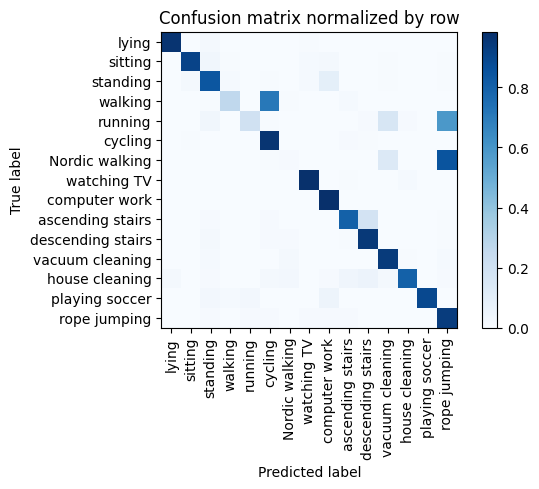

Training Epoch:  20%|██        | 3/15 [01:37<06:30, 32.56s/it]

Overall accuracy: 0.752

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.922      0.986      0.953      0.139        621|	 house cleaning: 0.003,	ascending stairs: 0.003,	
          walking       0.913      0.263      0.409      0.098        437|	 cycling: 0.709,	ascending stairs: 0.014,	
         standing       0.887      0.840      0.863      0.088        394|	 computer work: 0.091,	sitting: 0.020,	
   house cleaning       0.968      0.799      0.876      0.085        379|	 descending stairs: 0.055,	ascending stairs: 0.040,	
            lying       0.981      0.968      0.974      0.083        373|	 standing: 0.019,	watching TV: 0.005,	
   Nordic walking       0.111      0.009      0.016      0.078        351|	 rope jumping: 0.849,	vacuum cleaning: 0.131,	
          cycling       0.504      0.965      0.662      0.077        345|	 ascending stairs: 0.009,	descending stairs: 0.006,	
  vacuum cleaning       0.782   


train: 100%|██████████| 283/283 [00:28<00:00, 10.08batch/s, loss=3.12e+3, accuracy=0.672]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.93batch/s, loss=3.36e+3]


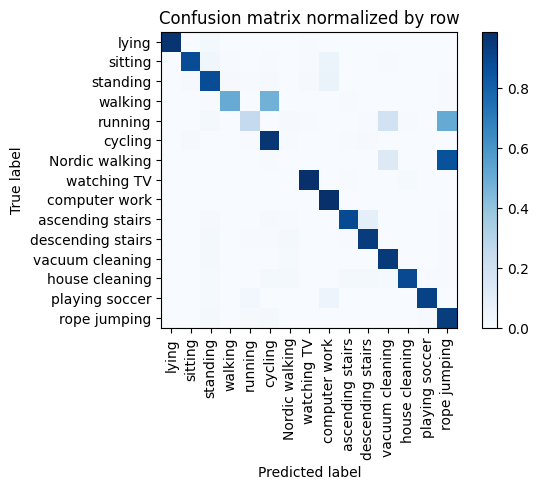

Training Epoch:  27%|██▋       | 4/15 [02:09<05:56, 32.39s/it]

Overall accuracy: 0.790

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.925      0.987      0.955      0.139        622|	 house cleaning: 0.003,	watching TV: 0.003,	
          walking       0.965      0.502      0.661      0.098        438|	 cycling: 0.477,	ascending stairs: 0.007,	
         standing       0.885      0.876      0.881      0.088        396|	 computer work: 0.063,	watching TV: 0.010,	
            lying       0.997      0.968      0.982      0.084        376|	 standing: 0.019,	watching TV: 0.005,	
   house cleaning       0.982      0.888      0.933      0.084        375|	 ascending stairs: 0.021,	Nordic walking: 0.019,	
   Nordic walking       0.042      0.003      0.005      0.078        351|	 rope jumping: 0.858,	vacuum cleaning: 0.128,	cycling: 0.006,	
  vacuum cleaning       0.785      0.948      0.859      0.077        343|	 standing: 0.020,	Nordic walking: 0.015,	
          cycling       0.589  


train: 100%|██████████| 283/283 [00:28<00:00, 10.04batch/s, loss=3.3e+3, accuracy=0.844]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.82batch/s, loss=3.21e+3]


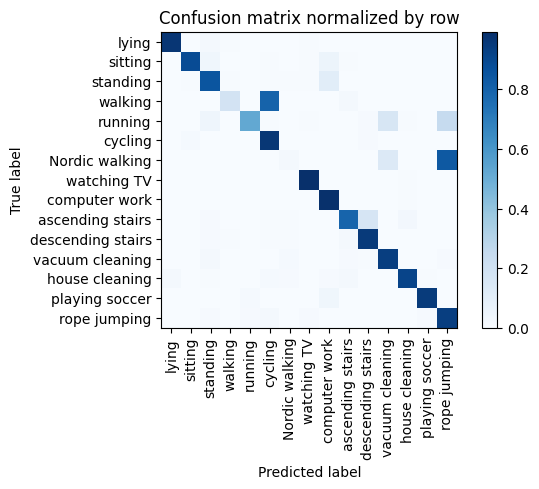

Training Epoch:  33%|███▎      | 5/15 [02:41<05:23, 32.35s/it]

Overall accuracy: 0.769

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.900      0.987      0.942      0.139        622|	 house cleaning: 0.006,	playing soccer: 0.003,	
          walking       0.908      0.181      0.302      0.097        436|	 cycling: 0.796,	ascending stairs: 0.023,	
         standing       0.897      0.854      0.875      0.088        396|	 computer work: 0.106,	watching TV: 0.008,	
   house cleaning       0.961      0.915      0.937      0.084        376|	 ascending stairs: 0.021,	lying: 0.016,	
            lying       0.981      0.968      0.974      0.083        370|	 standing: 0.016,	watching TV: 0.005,	
   Nordic walking       0.333      0.020      0.038      0.079        352|	 rope jumping: 0.835,	vacuum cleaning: 0.134,	
  vacuum cleaning       0.808      0.937      0.868      0.077        347|	 standing: 0.017,	Nordic walking: 0.014,	
          cycling       0.478      0.965      0.639  


train: 100%|██████████| 283/283 [00:28<00:00, 10.10batch/s, loss=3.26e+3, accuracy=0.641]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.49batch/s, loss=3.14e+3]


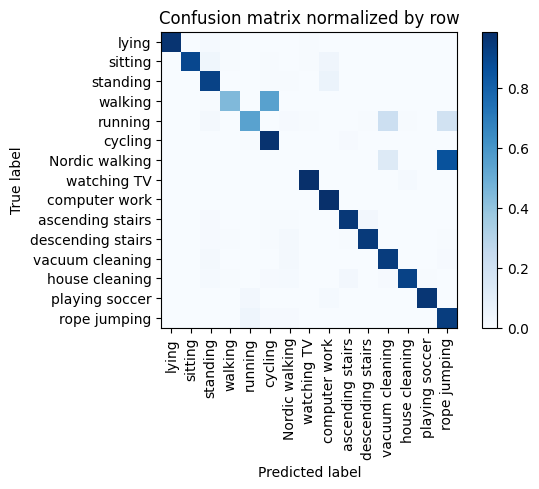

Training Epoch:  40%|████      | 6/15 [03:13<04:50, 32.28s/it]

Overall accuracy: 0.811

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.938      0.989      0.963      0.140        627|	 playing soccer: 0.003,	house cleaning: 0.003,	
          walking       0.960      0.441      0.604      0.097        433|	 cycling: 0.552,	standing: 0.005,	
         standing       0.905      0.917      0.911      0.088        396|	 computer work: 0.061,	cycling: 0.008,	
            lying       1.000      0.971      0.985      0.084        376|	 standing: 0.013,	watching TV: 0.005,	
   house cleaning       0.977      0.917      0.946      0.083        374|	 ascending stairs: 0.024,	Nordic walking: 0.013,	
   Nordic walking       0.042      0.003      0.005      0.078        348|	 rope jumping: 0.859,	vacuum cleaning: 0.126,	house cleaning: 0.003,	
  vacuum cleaning       0.790      0.942      0.859      0.077        347|	 Nordic walking: 0.020,	standing: 0.017,	
          cycling       0.572    


train: 100%|██████████| 283/283 [00:29<00:00,  9.74batch/s, loss=3.23e+3, accuracy=0.812]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.14batch/s, loss=3.13e+3]


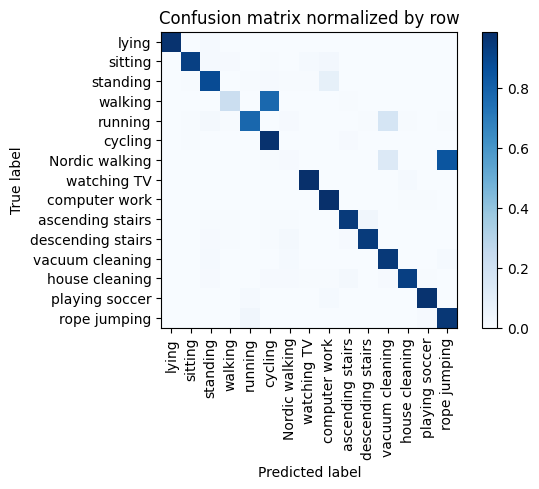

Training Epoch:  47%|████▋     | 7/15 [03:47<04:20, 32.61s/it]

Overall accuracy: 0.798

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.933      0.987      0.959      0.138        620|	 house cleaning: 0.006,	playing soccer: 0.005,	
          walking       0.923      0.219      0.354      0.098        439|	 cycling: 0.774,	ascending stairs: 0.007,	
         standing       0.935      0.881      0.907      0.088        395|	 computer work: 0.081,	cycling: 0.010,	
            lying       0.997      0.973      0.985      0.084        375|	 standing: 0.013,	playing soccer: 0.003,	
   house cleaning       0.977      0.928      0.952      0.083        374|	 ascending stairs: 0.016,	Nordic walking: 0.011,	
   Nordic walking       0.182      0.011      0.021      0.078        351|	 rope jumping: 0.846,	vacuum cleaning: 0.134,	
          cycling       0.488      0.977      0.651      0.077        346|	 ascending stairs: 0.012,	sitting: 0.006,	
  vacuum cleaning       0.801      0.951    


train: 100%|██████████| 283/283 [00:28<00:00, 10.08batch/s, loss=3.16e+3, accuracy=0.766]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.19batch/s, loss=3.23e+3]


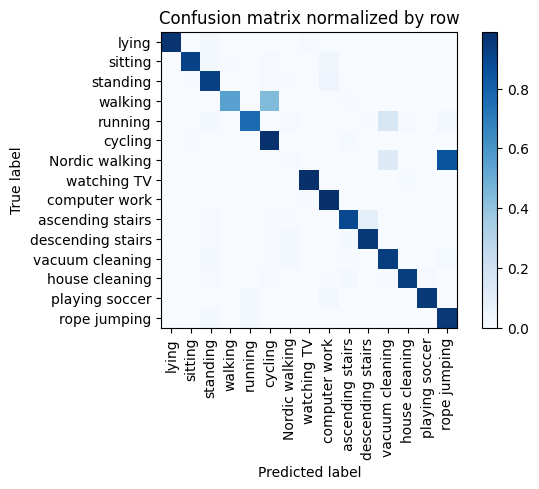

Training Epoch:  53%|█████▎    | 8/15 [04:19<03:47, 32.51s/it]

Overall accuracy: 0.832

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.943      0.990      0.966      0.139        623|	 watching TV: 0.005,	playing soccer: 0.003,	
          walking       0.984      0.550      0.706      0.097        436|	 cycling: 0.438,	ascending stairs: 0.007,	
         standing       0.917      0.927      0.922      0.088        395|	 computer work: 0.048,	cycling: 0.010,	
   house cleaning       0.986      0.938      0.961      0.083        372|	 ascending stairs: 0.019,	playing soccer: 0.008,	
            lying       1.000      0.968      0.984      0.083        370|	 standing: 0.016,	watching TV: 0.008,	
   Nordic walking       0.158      0.009      0.016      0.078        350|	 rope jumping: 0.851,	vacuum cleaning: 0.131,	
  vacuum cleaning       0.806      0.934      0.866      0.078        348|	 standing: 0.020,	Nordic walking: 0.017,	
          cycling       0.621      0.980      0.760


train: 100%|██████████| 283/283 [00:28<00:00,  9.82batch/s, loss=3.07e+3, accuracy=0.844]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.48batch/s, loss=3.42e+3]


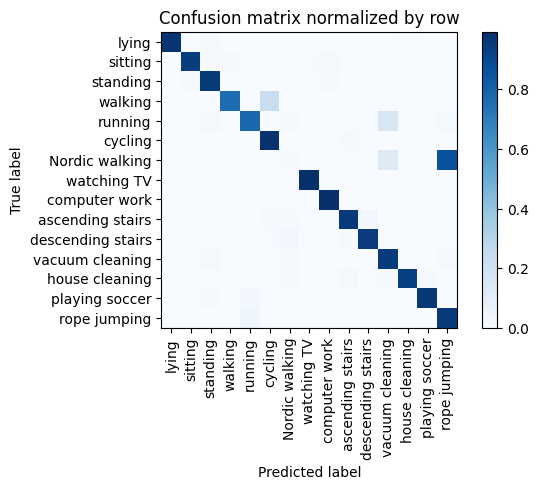

Training Epoch:  60%|██████    | 9/15 [04:52<03:15, 32.65s/it]

Overall accuracy: 0.862

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.979      0.987      0.983      0.139        622|	 playing soccer: 0.006,	house cleaning: 0.003,	
          walking       0.982      0.762      0.858      0.097        433|	 cycling: 0.231,	ascending stairs: 0.005,	
         standing       0.938      0.957      0.947      0.088        394|	 computer work: 0.013,	sitting: 0.010,	
   house cleaning       0.983      0.934      0.958      0.084        377|	 ascending stairs: 0.021,	Nordic walking: 0.013,	
            lying       0.995      0.971      0.983      0.084        377|	 standing: 0.016,	house cleaning: 0.005,	
   Nordic walking       0.154      0.011      0.021      0.078        348|	 rope jumping: 0.859,	vacuum cleaning: 0.129,	
          cycling       0.760      0.986      0.858      0.077        347|	 ascending stairs: 0.012,	running: 0.003,	
  vacuum cleaning       0.806      0.951    


train: 100%|██████████| 283/283 [00:28<00:00,  9.94batch/s, loss=2.97e+3, accuracy=0.688]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.65batch/s, loss=2.86e+3]


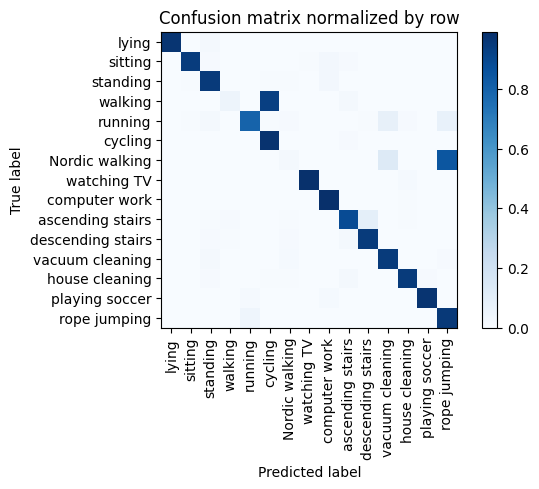

Training Epoch:  67%|██████▋   | 10/15 [05:24<02:43, 32.62s/it]

Overall accuracy: 0.790

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.969      0.992      0.980      0.139        623|	 house cleaning: 0.005,	playing soccer: 0.002,	
          walking       0.840      0.048      0.091      0.098        439|	 cycling: 0.932,	ascending stairs: 0.016,	
         standing       0.935      0.952      0.943      0.087        392|	 computer work: 0.026,	cycling: 0.008,	
            lying       1.000      0.971      0.985      0.084        375|	 standing: 0.016,	house cleaning: 0.003,	
   house cleaning       0.973      0.949      0.961      0.083        374|	 ascending stairs: 0.016,	playing soccer: 0.011,	
   Nordic walking       0.286      0.017      0.032      0.078        350|	 rope jumping: 0.846,	vacuum cleaning: 0.131,	
  vacuum cleaning       0.841      0.948      0.891      0.077        346|	 standing: 0.020,	Nordic walking: 0.014,	
          cycling       0.448      0.980     


train: 100%|██████████| 283/283 [00:29<00:00,  9.74batch/s, loss=3.36e+3, accuracy=0.844]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.05batch/s, loss=3.4e+3]


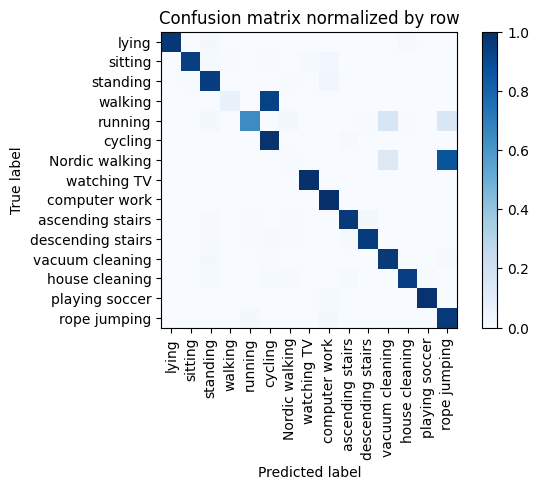

Training Epoch:  73%|███████▎  | 11/15 [05:58<02:11, 32.83s/it]

Overall accuracy: 0.790

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.961      0.994      0.977      0.140        625|	 house cleaning: 0.003,	watching TV: 0.003,	
          walking       0.906      0.067      0.124      0.097        435|	 cycling: 0.926,	ascending stairs: 0.002,	
         standing       0.923      0.944      0.934      0.088        394|	 computer work: 0.033,	Nordic walking: 0.008,	
   house cleaning       0.983      0.941      0.962      0.083        374|	 ascending stairs: 0.013,	cycling: 0.013,	
            lying       1.000      0.971      0.985      0.083        374|	 standing: 0.016,	house cleaning: 0.008,	
   Nordic walking       0.133      0.006      0.011      0.078        350|	 rope jumping: 0.860,	vacuum cleaning: 0.131,	
          cycling       0.452      0.986      0.620      0.077        347|	 ascending stairs: 0.012,	running: 0.003,	
  vacuum cleaning       0.811      0.959      0


train: 100%|██████████| 283/283 [00:30<00:00,  9.22batch/s, loss=3.08e+3, accuracy=0.703]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:04<00:00, 15.78batch/s, loss=3.16e+3]


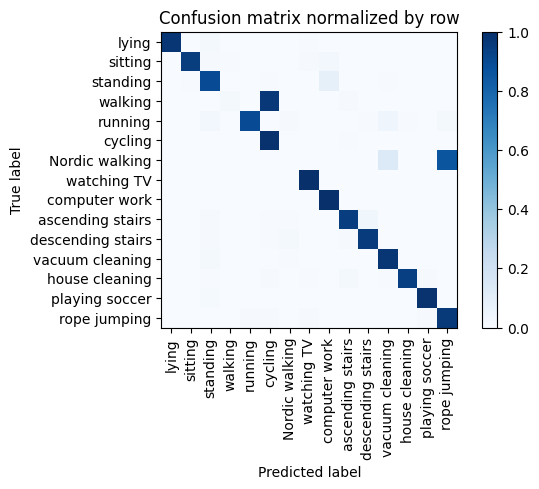

Training Epoch:  80%|████████  | 12/15 [06:33<01:41, 33.67s/it]

Overall accuracy: 0.792

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.938      0.994      0.965      0.139        622|	 watching TV: 0.003,	house cleaning: 0.002,	
          walking       0.636      0.016      0.031      0.098        437|	 cycling: 0.966,	ascending stairs: 0.011,	
         standing       0.924      0.891      0.907      0.088        394|	 computer work: 0.084,	cycling: 0.008,	
   house cleaning       0.989      0.939      0.963      0.084        376|	 ascending stairs: 0.016,	playing soccer: 0.011,	
            lying       0.997      0.973      0.985      0.084        375|	 standing: 0.016,	watching TV: 0.005,	
   Nordic walking       0.091      0.003      0.006      0.077        347|	 rope jumping: 0.856,	vacuum cleaning: 0.135,	ascending stairs: 0.003,	
          cycling       0.441      0.991      0.611      0.077        346|	 ascending stairs: 0.006,	sitting: 0.003,	
  vacuum cleaning       0


train: 100%|██████████| 283/283 [00:29<00:00,  9.75batch/s, loss=3.13e+3, accuracy=0.734]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.53batch/s, loss=3.11e+3]


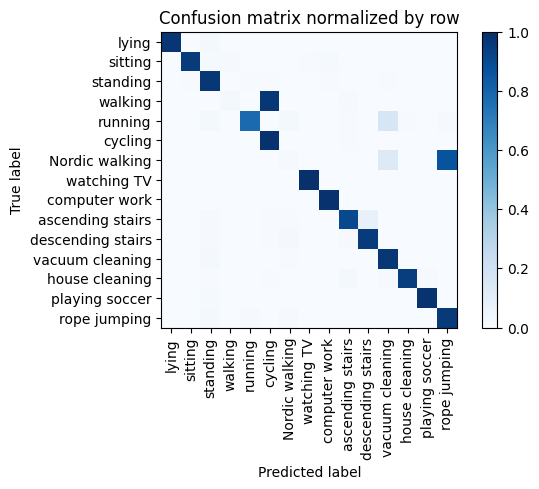

Training Epoch:  87%|████████▋ | 13/15 [07:06<01:07, 33.51s/it]

Overall accuracy: 0.793

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.987      0.992      0.990      0.140        625|	 house cleaning: 0.003,	playing soccer: 0.002,	
          walking       0.583      0.016      0.031      0.098        438|	 cycling: 0.970,	ascending stairs: 0.009,	
         standing       0.924      0.969      0.946      0.087        389|	 computer work: 0.008,	vacuum cleaning: 0.005,	
   house cleaning       0.986      0.947      0.966      0.083        374|	 ascending stairs: 0.019,	playing soccer: 0.011,	
            lying       0.997      0.973      0.985      0.083        373|	 standing: 0.016,	house cleaning: 0.003,	
   Nordic walking       0.214      0.009      0.017      0.078        349|	 rope jumping: 0.865,	vacuum cleaning: 0.126,	
          cycling       0.442      0.991      0.611      0.077        346|	 ascending stairs: 0.006,	running: 0.003,	
  vacuum cleaning       0.809      0


train: 100%|██████████| 283/283 [00:29<00:00,  9.68batch/s, loss=3.64e+3, accuracy=0.828]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.90batch/s, loss=3.03e+3]


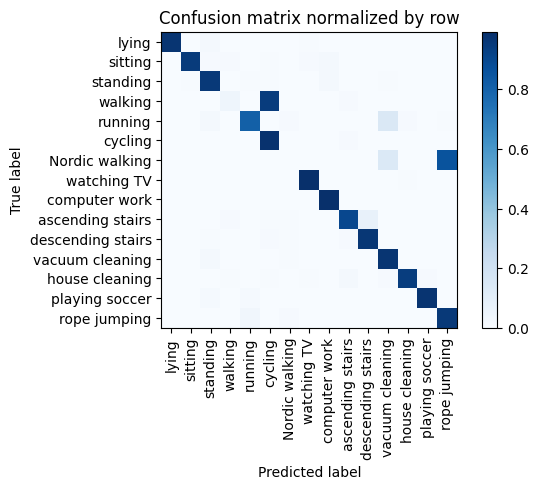

Training Epoch:  93%|█████████▎| 14/15 [07:40<00:33, 33.44s/it]

Overall accuracy: 0.795

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.978      0.994      0.986      0.140        627|	 watching TV: 0.003,	house cleaning: 0.002,	
          walking       0.704      0.043      0.082      0.098        438|	 cycling: 0.945,	ascending stairs: 0.009,	
         standing       0.942      0.957      0.949      0.088        393|	 computer work: 0.020,	vacuum cleaning: 0.005,	
   house cleaning       0.986      0.942      0.964      0.085        379|	 ascending stairs: 0.018,	playing soccer: 0.011,	
            lying       0.997      0.973      0.985      0.084        375|	 standing: 0.016,	watching TV: 0.005,	
          cycling       0.446      0.986      0.615      0.077        347|	 ascending stairs: 0.012,	sitting: 0.003,	
   Nordic walking       0.000      0.000      0.000      0.077        345|	 rope jumping: 0.858,	vacuum cleaning: 0.136,	ascending stairs: 0.003,	
  vacuum cleaning


train: 100%|██████████| 283/283 [00:28<00:00, 10.03batch/s, loss=3.22e+3, accuracy=0.828]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:04<00:00, 17.37batch/s, loss=3.26e+3]


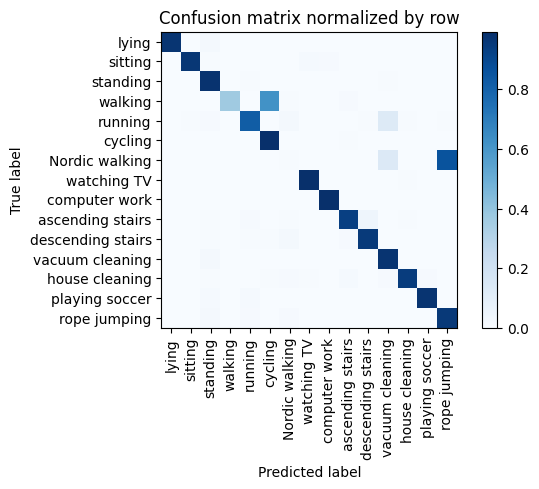

Overall accuracy: 0.832

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.994      0.993      0.140        627|	 house cleaning: 0.003,	watching TV: 0.003,	
          walking       0.994      0.365      0.534      0.098        438|	 cycling: 0.619,	ascending stairs: 0.009,	
         standing       0.941      0.980      0.960      0.088        394|	 running: 0.008,	vacuum cleaning: 0.005,	
            lying       1.000      0.973      0.987      0.084        376|	 standing: 0.016,	descending stairs: 0.003,	
   house cleaning       0.986      0.944      0.965      0.084        375|	 ascending stairs: 0.013,	playing soccer: 0.011,	
   Nordic walking       0.125      0.006      0.011      0.078        350|	 rope jumping: 0.860,	vacuum cleaning: 0.134,	
  vacuum cleaning       0.816      0.977      0.889      0.077        345|	 standing: 0.017,	rope jumping: 0.003,	
          cycling       0.553      0.991     

unseen: 100%|██████████| 60/60 [00:02<00:00, 20.28batch/s, loss=3.33e+3]


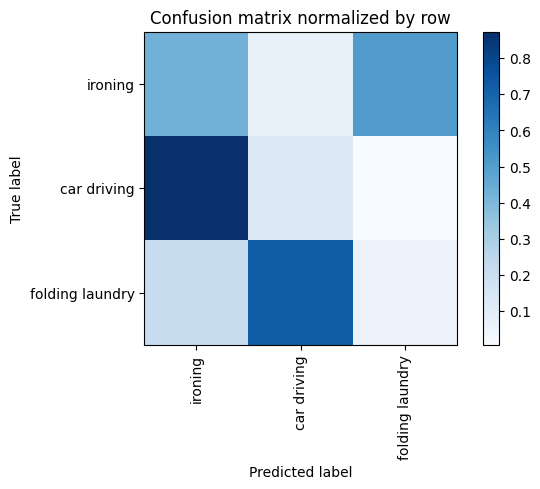

Overall accuracy: 0.289

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.593      0.424      0.494      0.607       2330|	 folding laundry: 0.506,	car driving: 0.070,	
folding laundry       0.045      0.057      0.051      0.254        975|	 car driving: 0.726,	ironing: 0.216,	
    car driving       0.068      0.120      0.087      0.139        535|	 ironing: 0.873,	folding laundry: 0.007,	

----------------------------------------------------------------------------------------------------
    avg / total       0.381      0.289      0.325        1.0       3840|	      

{'accuracy': 0.28854166666666664, 'precision': 0.23554917735013037, 'recall': 0.20036546680804831, 'f1': 0.21070672058259665}
============== Overall Unseen Classes Performance ==============


accuracy     0.326218
precision    0.270596
recall       0.282261
f1           0.260331
dtype: float64

In [37]:
fold_metric_scores = []
for i, cs in enumerate(fold_cls_ids):
    print("="*16, f'Fold-{i}', "="*16)
    print(f'Unseen Classes : {fold_classes[i]}')

    data_dict = dataReader.generate(unseen_classes=cs, seen_ratio=config['seen_split'], unseen_ratio=config['unseen_split'], window_size=5.21, window_overlap=4.21, resample_freq=20)
    all_classes = dataReader.idToLabel
    seen_classes = data_dict['seen_classes']
    unseen_classes = data_dict['unseen_classes']
    print("seen classes > ", seen_classes)
    print("unseen classes > ", unseen_classes)
    train_n, in_ft = data_dict['train']['X'].shape

    print("Initiate IMU datasets ...")
    # build IMU datasets
    train_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    train_dl = DataLoader(train_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build seen eval_dt
    eval_dt = PAMAP2Dataset(data=data_dict['eval-seen']['X'], actions=data_dict['eval-seen']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    eval_dl = DataLoader(eval_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build unseen test_dt
    test_dt = PAMAP2Dataset(data=data_dict['test']['X'], actions=data_dict['test']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=unseen_classes, seq_len=100)
    test_dl = DataLoader(test_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    
    # build model
    model = SOTAEmbedding(
        linear_filters=config["model_params"]["linear_filters"],
        input_feat=config["model_params"]["input_feat"],
        dropout=config["model_params"]["dropout"]
    )
    # model = Model1(feat_dim=in_ft, max_len=seq_len, d_model=config['d_model'], n_heads=config['num_heads'], num_layers=2, dim_feedforward=128, ft_size=feat_size)
    model.to(device)
    # define run parameters 
    optimizer = Adam(model.parameters(), lr=config['lr'],weight_decay=1e-5)
    loss_module = {'class': nn.CrossEntropyLoss(reduction="sum"), 'feature': nn.L1Loss(reduction="sum")}
    best_acc = 0.0
    # train the model 
    for epoch in tqdm(range(config['n_epochs']), desc='Training Epoch', leave=False):
        train_metrics = train_step(model, train_dl, train_dt,optimizer, loss_module, device, class_names=[all_classes[i] for i in seen_classes], phase='train', loss_alpha=0.0001)
        eval_metrics = eval_step(model, eval_dl, eval_dt,loss_module, device, class_names=[all_classes[i] for i in seen_classes], phase='seen', print_report=True, loss_alpha=0.0001)
        # print(f"EPOCH [{epoch}] TRAINING : {train_metrics}")
        # print(f"EPOCH [{epoch}] EVAL : {eval_metrics}")
        if eval_metrics['accuracy'] > best_acc:
            best_model = deepcopy(model.state_dict())
    
    # replace by best model 
    model.load_state_dict(best_model)
    save_model(model,notebook_iden,model_iden,i)

    # run evaluation on unseen classes
    test_metrics = eval_step(model, test_dl,test_dt, loss_module, device, class_names=[all_classes[i] for i in unseen_classes],   phase='unseen', loss_alpha=0.0001)
    fold_metric_scores.append(test_metrics)
    print(test_metrics)
    print("="*40)

print("="*14, "Overall Unseen Classes Performance", "="*14)
seen_score_df = pd.DataFrame.from_records(fold_metric_scores)
seen_score_df.mean()
